In [83]:
def fractal(x,df):
    global inpadoc_undo_nested
    global inpadoc_family_members_refractal_list
    global add_members
    add_members = ""
    inpadoc_family_members_refractal_list = []
    inpadoc_undo_nested = []  
    checklist = str(df["publication_number"])
    #add inpadox to list
    #if len(x)> 1:
     #   list(chain.from_iterable(x))
    #else:
     #   list(x)
    for k in x:
        ##print(len(k))
        if len(k) > 4:
            inpadoc_family_members_refractal_list.append(k)
            #print(inpadoc_family_members_refractal_list)
        else:
            #print("skiperino")
            continue
        if k in checklist:
            #print("1:"+k)
            family_members = list(chain.from_iterable(list(df.loc[df["publication_number"]==str(k),"inpadoc_family_members"])))
            #print("HALLO"+family_members)
            for members in family_members:
                if len(members) > 4:
                    
                    inpadoc_family_members_refractal_list.append(members)
                    
                    list(chain.from_iterable(inpadoc_family_members_refractal_list))
                else:
                    continue
            #print("2:"+str(inpadoc_family_members_refractal_list))

        else:
            continue
            #print("pass")
    #print(inpadoc_family_members_refractal_list)
    return inpadoc_family_members_refractal_list

def rerun_slower(x,df):
    global inpadoc_undo_nested
    global inpadoc_family_members_refractal_list
    inpadoc_family_members_refractal_list = []
    inpadoc_undo_nested = []  
    global run0
    run0 = fractal(x,df)
    run1 = fractal(run0,df)
    test1 = run0
    test2 = run1
    k= 0
    #print(run0)
    #print(run1)
    while set(test1) != set(test2):
        #print("hallo"+str(k))
        globals()[f"run1"] = fractal(run0,df)
        test1 = run1
        globals()[f"run0"] = fractal(run1,df)
        test2 = run0
        k=+1
        #print(k)
        #print("Startwert:"+str(globals()[f"run{k}"]))
        #print("Ergebnis:"+str(globals()[f"run{k}"]))
    return list(set(test2))

In [84]:
import geopandas as gpd
import matplotlib.pyplot as plt  
import matplotlib.animation 
#import matplotlib
#matplotlib.use('TkAgg')
import numpy as np
#Wetter-API Import
import requests 

import os
import pandas as pd
import psycopg2
#import contextily as ctx
#from shapely.geometry import Point
from mpl_toolkits.axes_grid1 import make_axes_locatable
from itertools import chain


In [85]:
#read files inside folder for translational data


from typing import List
import pathlib
wd = os.getcwd()
wd = wd+"/Prepared_Data"
def find_excel_files_in(directory:pathlib.Path) -> List[pathlib.Path]:
    
    files:List[pathlib.Path] = list()
    for filepath in directory.rglob('*.csv'):
        if filepath.is_file():
            files.append(filepath)

    return files

# List of your directories
directories:List[str] = [format(wd)]

found_files:List[pathlib.Path] = list()

for directory in directories:
    directory:pathlib.Path = pathlib.Path(directory)
    found_files.extend(find_excel_files_in(directory))

#read excel files
import pandas as pd

#print(files)
    #Deleting all empty rows in the file df
for files in found_files:
    data = pd.read_csv(files)



KeyboardInterrupt: 

In [ ]:
data.optimized_assignee

0                                    univ wuhan technology
1                                        tongji university
2                    china railway eryuan eng group co ltd
3                   zunyi rural development service center
4                 changjiang inst survey planning design &
                               ...                        
18702    guangdong res inst water resources & hyd | gua...
18703                             soletanche freyssinet sa
18704                                       doosan holding
18705                             soletanche freyssinet sa
18706                                 cj cheil jedang corp
Name: optimized_assignee, Length: 18707, dtype: object

Applying filters

In [ ]:
#filter for assignee/applicants

assignee = "shell oil company"




In [ ]:
#filter for assignee/applicants


#Prepare a compare column for assignee filter
assignee2 = assignee.lower()
assignee2 = assignee2.replace(" ","")
data["compare"] = data["optimized_assignee"]
data["compare"] =data["compare"].str.lower()
data["compare"] =data["compare"].str.replace(" ","")
#converting inpadoc_family_members back to list
data["inpadoc_family_members"] = data["inpadoc_family_members"].str.replace("'","")
data["inpadoc_family_members"] = data["inpadoc_family_members"].str.replace("[","")
data["inpadoc_family_members"] = data["inpadoc_family_members"].str.replace("]","")
data["inpadoc_family_members"] = data["inpadoc_family_members"].str.replace(" ","")
data["inpadoc_family_members"] = data["inpadoc_family_members"].fillna("")
data["inpadoc_family_members"] = data.apply(lambda x: x["inpadoc_family_members"] 
                                                        if len(x["inpadoc_family_members"]) > 4 
                                                        else "",axis=1 )
#check if publication number has been added to inpadoc_family_members and if not add it
data["inpadoc_family_members"] = data.apply(lambda x: str(x["publication_number"])+ " | " +str(x["inpadoc_family_members"]) 
                                            if str(x["publication_number"]) not in str(x["inpadoc_family_members"]) else str(x["inpadoc_family_members"])
                                            ,axis = 1)

#prepare inpadoc_family_members_column
data["inpadoc_family_members"] = data.apply(lambda x: str(x["inpadoc_family_members"]).split(","),axis = 1)

#data["inpadoc_family_members"] = data.apply(lambda x: x["inpadoc_family_members_list"].split(","),axis = 1)

#apply filter
data = data[data["compare"]==assignee2]
data.drop("compare",axis = 1,inplace = True)
#inpadoc_family_members_list = list(pre_data["inpadoc_family_members"])

#look for other members in the family
#inpadoc_family_members_list = rerun_slower(inpadoc_family_members_list,data)
#data[data["publication_number"].isin(inpadoc_family_members_list)]

#creation of comparable dataframe
data_compare = data

/var/folders/s2/tyd6009d2976k2634g6cfl140000gn/T/ipykernel_67692/837641506.py:12: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  data["inpadoc_family_members"] = data["inpadoc_family_members"].str.replace("[","")
/var/folders/s2/tyd6009d2976k2634g6cfl140000gn/T/ipykernel_67692/837641506.py:13: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  data["inpadoc_family_members"] = data["inpadoc_family_members"].str.replace("]","")


In [ ]:
data

,publication_number,title,assignee_or_applicant,priority_date_earliest,application_date,publication_date,inpadoc_family_members,optimized_assignee,inventor,abstract,...,st.30,simplified_status,patent_status_description,use,method,mixture,len_claims,len_inpadoc,test,len_test
294,WO2021216638A1,method for estimating fluid saturation of a ro...,"shell oil company,us | shell internationale re...",2020-04-22,2021-04-21,2021-10-28,[WO2021216638A1],shell oil company,"saxena, nishank | alpak, faruk ömer | hows, am...",the present invention provides a method for es...,...,440,not granted,date of publication by printing or similar pro...,0,17,0,17,1,['WO2021216638A1'],1
931,WO2022002810A1,method for estimating hydrocarbon saturation o...,shell internationale research maatschappij b.v...,2020-06-30,2021-06-28,2022-01-06,[WO2022002810A1],shell oil company,"saxena, nishank | alpak, faruk ömer | hows, am...",the present invention provides a method for es...,...,440,not granted,date of publication by printing or similar pro...,0,19,0,19,1,['WO2022002810A1'],1
3149,CN205934968U,预制装配式地下筒仓结构 | prefabricated assembly type unde...,"黄竟强,成都市,四川省,611130,cn",2016-08-16,2016-08-16,2017-02-08,[CN205934968U],shell oil company,黄竟强 | 陈静 | 胡秉偃 | 刘雨 | 董世海 | 彭丹,this utility model is relates to underground s...,...,430,not granted,date of publication by printing or similar pro...,0,0,4,4,1,['CN205934968U'],1
3153,CN106088154A,预制装配式地下筒仓复合井筒施工方法及筒仓结构 | prefabricated assembl...,"黄竟强,成都市,四川省,611130,cn",2016-08-16,2016-08-16,2016-11-09,"[CN106088154A, CN106088154B]",shell oil company,黄竟强 | 陈静 | 胡秉偃 | 刘雨 | 董世海 | 彭丹,the invention claims an underground silo facil...,...,430,not granted,date of publication by printing or similar pro...,0,6,3,9,2,"['CN106088154A', 'CN106088154B']",2
10325,WO2021119235A1,procédé d'estimation de la saturation en hydro...,"shell oil company,us | shell internationale re...",2019-12-12,2020-12-10,2021-06-17,[WO2021119235A1],shell oil company,"saxena, nishank | hows, amie marie | appel, ma...",the present invention provides a method for es...,...,440,not granted,date of publication by printing or similar pro...,0,19,0,19,1,['WO2021119235A1'],1
11400,AU2002336664B2,thermally enhanced soil decontamination method,shell internationale research maatschappij b.v...,2001-10-24,2002-10-24,2007-09-13,"[AU2002336664B2, AT299403T, AU2002336664C1, BR...",shell oil company,"de rouffignac, eric, pierre | stegemeier, geor...",a method is provided to remove contaminants fr...,...,450,granted,date of publication by printing or similar pro...,0,16,0,16,22,"['EP1467826B1', 'AT299403T', 'DK1467826T3', 'B...",22
11401,CA2463053C,biorestauration de sols contamines par du merc...,"shell canada limited,calgary,a1,ca",2001-10-24,2002-10-24,2010-09-21,"[CA2463053C, AT342138T, AU2002365145A1, AU2002...",shell oil company,"vinegar, harold j. | stegemeier, george leo",an in situ soil remediation system may be used...,...,450,granted,date of publication by printing or similar pro...,0,48,22,70,22,"['US20040120771A1', 'KR2004048991A', 'BR200213...",22
11403,CA2463108A1,isolation de sol par barriere de congelation a...,"shell canada limited,calgary,a1,ca",2001-10-24,2002-10-24,2003-05-01,"[CA2463108A1, AT402294T, AU2002359299B2, BR200...",shell oil company,"vinegar, harold j. | stegemeier, george leo",l'invention concerne l'utilisation éventuelle ...,...,430,not granted,date of publication by printing or similar pro...,0,60,19,79,20,"['BRPI0213513B8', 'US6854929B2', 'MX2004003711...",20
11404,WO2003051546A2,positionnement d'un puits pour assainissement ...,"shell oil company,us | shell canada limited,ca",2001-10-24,2002-10-24,2003-06-26,"[WO2003051546A2, AU2002364942A1, US20030110794...",shell oil company,"vinegar, harold, j. | stegemeier, george, leo",cette invention concerne un système d'assainis...,...,430,not granted,date of publication by printing or similar pro...,0,27,7,34,4,"['AU2002364942A1', 'US20030110794A1', 'WO20030...",4
11405,AU2002336664A1,thermally enhance

In [ ]:
data_compare[data_compare["publication_number"]== "AU2012203086B8"]



,publication_number,title,assignee_or_applicant,priority_date_earliest,application_date,publication_date,inpadoc_family_members,optimized_assignee,inventor,abstract,...,st.30,simplified_status,patent_status_description,use,method,mixture,len_claims,len_inpadoc,test,len_test


In [ ]:
data_compare[data_compare["publication_number"]== "AU2012203086A1"]



,publication_number,title,assignee_or_applicant,priority_date_earliest,application_date,publication_date,inpadoc_family_members,optimized_assignee,inventor,abstract,...,st.30,simplified_status,patent_status_description,use,method,mixture,len_claims,len_inpadoc,test,len_test


In [ ]:
list(data.inpadoc_family_members)[5][0]

'AU2002336664B2'

In [ ]:
#creation of df containg every family member as entry even tho some data might not exists 
#creation of df containg every family member as entry even tho some data might not exists 
publication_number = []
inpadoc_family = []
listdata = list(data.inpadoc_family_members)
for i in range(len(listdata)):
    for k in range(len(listdata[i])):
        #print(str(i)+"   "+str(k)+"list:"+listdata[i][k])
        publication_number.append(listdata[i][k])
        inpadoc_family.append(listdata[i])
d = {'publication_number': publication_number,
    'inpadoc_family_members': inpadoc_family}
data_family = pd.DataFrame(data=d)
#make column inpadoc_family_members mergable
data["inpadoc_family_members"] = data["inpadoc_family_members"].astype("string")
data_family["inpadoc_family_members"] = data_family["inpadoc_family_members"].astype("string")
#merge
data_family = data_family.merge(data_compare, right_on=['publication_number','inpadoc_family_members'],left_on=['publication_number','inpadoc_family_members'],how="left")

data_family.reset_index(inplace= True)
data_family = data_family.drop("index", axis = 1)
#drop duplicates
data_family = data_family.drop_duplicates(subset=["publication_number"], keep="first")
data = data_family

In [ ]:
#DATA ADJUSTMENTS

#read files inside folder for translation of publication Number 

wd = os.getcwd()
from typing import List
import pathlib
wd2 = wd + "/Translationaldata"
def find_excel_files_in(directory:pathlib.Path) -> List[pathlib.Path]:
    
    files:List[pathlib.Path] = list()
    for filepath in directory.rglob('*.xlsx'):
        if filepath.is_file():
            files.append(filepath)

    return files

# List of your directories
directories:List[str] = [format(wd2)]

found_files:List[pathlib.Path] = list()

for directory in directories:
    directory:pathlib.Path = pathlib.Path(directory)
    found_files.extend(find_excel_files_in(directory))

#read excel files
import pandas as pd

#print(files)
    #Deleting all empty rows in the file df
for files in found_files:
    xls = pd.ExcelFile(files)

file = pd.read_excel(xls, "PUBLNR",skiprows=2)

filter = file["DOCDB"] != " "
file = file[filter]

#Filling all empty cells in the country code(CC) column inside file df

for x in range(len(file)):
    if file.iloc[x][0] != " ":
        shortcode_for_country = file.iloc[x][0]
    if file.iloc[x][0] == " ":
        file.iloc[x][0] = shortcode_for_country
    if file.iloc[x][1] != " ":
        countryname = file.iloc[x][1]
    if file.iloc[x][1] == " ":
        file.iloc[x][1] = countryname




#read ST.30 Sheet in excel file for creating "simplified_status",patent_status and patent_status_description
df1_additional = pd.read_excel(xls, 'ST30_Pub availability',skiprows = 2)
df1_additional = df1_additional[["Unnamed: 0", "Kindcode", "ST.30"]].astype("string").fillna(" ")
df1_additional.reset_index(inplace= True)
df1_additional = df1_additional.drop("index", axis = 1)
df1_additional["Kindcode"] = df1_additional["Kindcode"].str.replace(" ","")
# #Filling all empty cells in the country code(CC) column

for x in range(len(df1_additional)):
    if df1_additional.iloc[x][0] != " ":
        shortcode_for_country = df1_additional.iloc[x][0]
    if df1_additional.iloc[x][0] == " ":
        df1_additional.loc[df1_additional.index[x], 'Unnamed: 0'] = f"{shortcode_for_country}"

#Concatenating all different types of documents into one Column

file = file.groupby(['CC','Description','DOCDB'])['Type of document'].apply(', '.join).reset_index()

for col in ["Type of document"]:
    file[col]=file[col].str.split(", ").map(set).str.join(", ")
file["Type of document"] = file["Type of document"].str.replace(', ','| ')

#Translation summary of the type of document
df1_translation = pd.read_excel(xls, 'ST30_Pub availability',skiprows = 0)
df1_translation = df1_translation[["ST.30","Description XML element"]].astype("string").fillna(" ")
filter = df1_translation["ST.30"] != " "
df1_translation = df1_translation[filter]

#Comparing columns from both data frames(file and data) to fill the column 'Country' in the data df
data.drop("country",axis = 1,inplace = True)
data["Country"] = ""
for i in range(len(data.publication_number)):
    #print(f'1 {i}')
    for x in range(len(file.CC)):
        #print(f'2 {x}')
        if data["publication_number"].iloc[i][0:2] == file.CC.iloc[x]:
            #print(f'3 {data["publication_number"].iloc[i][0:2]}')
            #print(f'4 {file.CC.iloc[x]}')  
            data.loc[i,'Country'] = file.loc[x,"Description"]
            break


#Inserting a "Type of document" column
#Comparing the last two indexes to the DOCDB column to determine the type of document
#Comparing the last index to the DOCDB column to determine the type of document
data["type_of_document"] = ""

for i in range(len(data.publication_number)):
    #print(f'1 {i}')
    for x in range(len(file.DOCDB)):
        #print(f'2 {x}')
        if data["publication_number"].iloc[i][-2:]  == file.DOCDB.iloc[x] and data["Country"].iloc[i] == file.Description.iloc[x]:
            #print(f'3 {data["publication_number"].iloc[i][0:2]}')
            #print(f'4 {file.CC.iloc[x]}')  
            #data['type_of_document'].iloc[i] = file["Type of document"].iloc[x]
            
            data.loc[i,"type_of_document"] = file.loc[x,"Type of document"]
            break
        if data["publication_number"].iloc[i][-1:]  == file.DOCDB.iloc[x] and data["Country"].iloc[i] == file.Description.iloc[x]:
            #print(f'3 {data["publication_number"].iloc[i][0:2]}')
            #print(f'4 {file.CC.iloc[x]}')  
            data.loc[i,"type_of_document"] = file.loc[x,"Type of document"]

            break
        
#Making a new column comparing two df
#The Kindcode from df1_additional df and publication number from the data df
#Numbers compared and inserted(450,470, A44 etc), each number represents a type
#of document

data["ST.30"] = ""
for i in range(len(data.publication_number)):
    #print(f'1 {i}')
    for x in range(len(df1_additional)):
        #print(f'2 {x}')
        if data["publication_number"].iloc[i][-2:]  == df1_additional["Kindcode"].iloc[x]:
            if data["publication_number"].iloc[i][0:2] == df1_additional["Unnamed: 0"].iloc[x]:
            #print(f'3 {data["publication_number"].iloc[i][0:2]}')
            #print(f'4 {file.CC.iloc[x]}')  
                data.loc[i,'ST.30'] = df1_additional.loc[x,'ST.30']
                break
        if data["publication_number"].iloc[i][-1:]  == df1_additional["Kindcode"].iloc[x]:
            if data["publication_number"].iloc[i][0:2] == df1_additional["Unnamed: 0"].iloc[x]:
            #print(f'3 {data["publication_number"].iloc[i][0:2]}')
            #print(f'4 {file.CC.iloc[x]}')  
                data.loc[i,'ST.30'] = df1_additional.loc[x,'ST.30']
                break

#create simplified_status column; look at df1_translation for changes
data["simplified_status"]= data.apply(lambda x: "granted" if x["ST.30"]== "450" or x["ST.30"]=="470"
                                                         else "not granted",axis=1)
                            
data["patent_status_description"] = ""
for i in range(len(data.publication_number)):

    for x in range(len(df1_translation)):
  
        if data["ST.30"].iloc[i]  == df1_translation["ST.30"].iloc[x]:
            data.loc[i,"patent_status_description"] = df1_translation.loc[x,'Description XML element']
            break
#make data columns lowercase
data.columns = data.columns.str.lower()
#hong kong to china in order to be displayed in worldmap later
data["country"] = data.apply(lambda x: "china" if x["country"]== 'hong kong (s.a.r.)' else x["country"],axis =1)


Check if the filter is usable

In [ ]:
pip install openpyxl

  Using cached openpyxl-3.0.10-py2.py3-none-any.whl (242 kB)
  Using cached et_xmlfile-1.1.0-py3-none-any.whl (4.7 kB)
Note: you may need to restart the kernel to use updated packages.


In [ ]:
if len(data) == 0:
    print("WARNING: no data available using this filter")
    print(len(data))
else:
    print("filter application works")
    print(len(data))

filter application works
1317


Creating 3 dataframes: All, Granted, Not-Granted 

In [ ]:
#make countrynames lowercase
data["country"] = data["country"].str.lower()

In [ ]:
#create data for total and add it to data df
#Creating 3 dataframes: All, Granted, Not-Granted with new column total_of_publication_number respectively
from pandas import NA

total_column = data[data['country'].values != ""]
total_column = total_column[["publication_number","country"]].groupby('country').agg('count')
total_column.rename(columns = {"publication_number" : "total_of_publication_number"}, inplace = True)
total_column.reset_index(inplace = True)
total_column["total_of_publication_number"] = total_column.apply(lambda x: NA if x["total_of_publication_number"] == 0 else x["total_of_publication_number"],axis = 1)
data_all_total = data.merge(total_column, left_on = 'country', right_on = 'country', how='left')
#data_all_total

#create data for proportion and add it to data df BUT FOR GRANTED ONLY
prestep= data[data['country'].values != ""]
total_column = prestep[prestep["simplified_status"] == "granted"]
if len(total_column) == 0:
    data_granted_total = None
    print("WARNING: no patents are granted with this filter")
else:
    total_column = total_column[["publication_number","country"]].groupby('country').agg('count')
    total_column.rename(columns = {"publication_number" : "total_of_publication_number"}, inplace = True)
    total_column.reset_index(inplace = True)
    total_column["total_of_publication_number"] = total_column.apply(lambda x: NA if x["total_of_publication_number"] == 0 else x["total_of_publication_number"],axis = 1)
    data_granted_total = data.merge(total_column, left_on = 'country', right_on = 'country', how='left')
    #data_granted_total

#create data for proportion and add it to data df BUT FOR NOT-GRANTED ONLY
prestep= data[data['country'].values != ""]
total_column = prestep[prestep["simplified_status"] == "not granted"]
if len(total_column) == 0:
    data_not_granted_total = None
    print("WARNING: no patents are not-granted with this filter")
    
else:
    total_column = total_column[["publication_number","country"]].groupby('country').agg('count')
    total_column.rename(columns = {"publication_number" : "total_of_publication_number"}, inplace = True)
    total_column.reset_index(inplace = True)
    total_column["total_of_publication_number"] = total_column.apply(lambda x: NA if x["total_of_publication_number"] == 0 else x["total_of_publication_number"],axis = 1)
    data_not_granted_total = data.merge(total_column, left_on = 'country', right_on = 'country', how='left')
    #data_not_granted_total

In [ ]:
total_column

,country,total_of_publication_number
0,australia,64
1,austria,9
2,brazil,11
3,canada,81
4,china,87
5,eurasian patent organization,24
6,european patent office,70
7,germany,9
8,india,4
9,israel,80


In [ ]:
#get current working directory

current_wd = os.getcwd()
path_worldmap= "/Worldmap/World_Countries.shp"
path_worldmap = current_wd+path_worldmap
path_worldmap

'/Users/felixsegelken/neuefische/Capstone_Project/Worldmap/World_Countries.shp'

In [ ]:
#read worldmap shape file
world_map = gpd.read_file(path_worldmap)

In [ ]:
#make country names lowercase in order to match dataframes by countrynames
world_map["COUNTRY"]=world_map["COUNTRY"].str.lower()
world_map.sort_values(by = "COUNTRY")

,COUNTRY,geometry
2,afghanistan,"POLYGON ((61.27656 35.60725, 61.29638 35.62853..."
5,albania,"POLYGON ((20.79192 40.43154, 20.78722 40.39472..."
3,algeria,"POLYGON ((-5.15213 30.18047, -5.13917 30.19236..."
9,american samoa (us),"POLYGON ((-170.74390 -14.37556, -170.74942 -14..."
237,american virgin islands (us),"POLYGON ((-64.89612 17.67667, -64.89140 17.683..."
...,...,...
240,western sahara,"POLYGON ((-14.30347 21.34167, -14.46722 21.340..."
242,western samoa,"MULTIPOLYGON (((-172.59650 -13.50911, -172.551..."
244,yemen,"MULTIPOLYGON (((48.68639 14.03750, 48.61000 14..."
245,zambia,"POLYGON ((30.21302 -14.98172, 30.21917 -15.096..."


In [ ]:
#adjust important names for merging
world_map["COUNTRY"] = world_map["COUNTRY"].str.replace("united states", "united states of america")
world_map["COUNTRY"] = world_map["COUNTRY"].str.replace("south korea", "korea (south)")
world_map["COUNTRY"] = world_map["COUNTRY"].str.replace("moldova", "republic of moldova")
world_map["COUNTRY"] = world_map["COUNTRY"].str.replace("russia", "russian federation")
#data["country"] = data["country"].str.replace("hong kong (s.a.r.)", "china")
#world_map["COUNTRY"] = world_map["COUNTRY"].str.replace(f"hong kong (s.a.r)", "china")

In [ ]:
if data_granted_total is not None:
    print("lol")

lol


In [ ]:
#merge dataframes
if data_all_total is not None:  
    merged_all = world_map.merge(data_all_total, left_on = 'COUNTRY', right_on = 'country', how='outer')
    merged_all['total_of_publication_number'] = merged_all['total_of_publication_number'].fillna(0)
else:
    print("WARNING: no patents exists using this filter")
#merge granted
if data_granted_total is not None:
    merged_granted = world_map.merge(data_granted_total, left_on = 'COUNTRY', right_on = 'country', how='outer')
    merged_granted['total_of_publication_number'] = merged_granted['total_of_publication_number'].fillna(0)
else:
    print("WARNING: no patents are granted using this filter")
if data_not_granted_total is not None:
    merged_not_granted = world_map.merge(data_not_granted_total, left_on = 'COUNTRY', right_on = 'country', how='outer')
    merged_not_granted['total_of_publication_number'] = merged_not_granted['total_of_publication_number'].fillna(0)
else:
    print("WARNING: no patents are not granted using this filter")

In [ ]:
#create list of countries that are not on the world map

countries_not_on_map = []
for element in list(total_column["country"]):
    if element not in list(world_map["COUNTRY"]):
        countries_not_on_map.append(element)
 
print(countries_not_on_map)

['eurasian patent organization', 'european patent office', 'world intellectual property organization (wipo)']


In [ ]:
#extract proportions for if "country" is no actual country
nocountries = total_column["country"].isin(countries_not_on_map)
nocountries = total_column[nocountries]
nocountries

,country,total_of_publication_number
5,eurasian patent organization,24
6,european patent office,70
19,world intellectual property organization (wipo),120


In [ ]:
merged_all[merged_all["COUNTRY"]=="china"]

,COUNTRY,geometry,publication_number,inpadoc_family_members,title,assignee_or_applicant,priority_date_earliest,application_date,publication_date,optimized_assignee,...,use,method,mixture,len_claims,len_inpadoc,test,len_test,country,st.30,total_of_publication_number
327,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN205934968U,['CN205934968U'],预制装配式地下筒仓结构 | prefabricated assembly type unde...,"黄竟强,成都市,四川省,611130,cn",2016-08-16,2016-08-16,2017-02-08,shell oil company,...,0.0,0.0,4.0,4.0,1.0,['CN205934968U'],1.0,china,430,87.0
328,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN106088154A,"['CN106088154A', 'CN106088154B']",预制装配式地下筒仓复合井筒施工方法及筒仓结构 | prefabricated assembl...,"黄竟强,成都市,四川省,611130,cn",2016-08-16,2016-08-16,2016-11-09,shell oil company,...,0.0,6.0,3.0,9.0,2.0,"['CN106088154A', 'CN106088154B']",2.0,china,430,87.0
329,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN106088154B,"['CN106088154A', 'CN106088154B']",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,440,87.0
330,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN101163780A,"['AU2006340864B2', 'AT427410T', 'AT434713T', '...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,430,87.0
331,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN101163780B,"['AU2006340864B2', 'AT427410T', 'AT434713T', '...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,440,87.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN102844520B,"['AU2006340864B2', 'AT427410T', 'AT434713T', '...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,440,87.0
410,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN102884279A,"['AU2006340864B2', 'AT427410T', 'AT434713T', '...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,430,87.0
411,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN102884279B,"['AU2006340864B2', 'AT427410T', 'AT434713T', '...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,440,87.0
412,china,"MULTIPOLYGON (((110.71583 20.06889, 110.77859 ...",CN104763396A,"['AU2006340864B2', 'AT427410T', 'AT434713T', '...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,430,87.0


In [ ]:
import math
def round_up_to_nearest_10(num):
    return math.ceil(num / 10) * 10

round_up_to_nearest_10(21)

30

<font size=3>
Hello
<font size=10>
Hello

In [87]:
#plot worldmap ALL
def plot_worldmap(df,situational,status):
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib import cm
    from matplotlib.colors import TwoSlopeNorm
    import statistics

    #statistics.median(percentage_column["proportion_of_publication_number"])


    fig, ax = plt.subplots(figsize = (20,10))

    #divider = make_axes_locatable(ax)

    #cax = divider.append_axes("right", size="5%", pad=0.1)

    # create a normalized colorbar
    #norm = TwoSlopeNorm(vmin=min(total_column["total_of_publication_number"]),
    #                vcenter=statistics.median(total_column["total_of_publication_number"]),
    #                vmax=max(total_column["total_of_publication_number"]))
    cmap=plt.cm.get_cmap('plasma', 50)
    #cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    #creating values for tick in legend; 20 ticks
    ticks = []
    for x in range(1,21):
        ticks.append(x/10*round_up_to_nearest_10(max(df["total_of_publication_number"])))

    tick_label = []
    for x in range(1,21):
       tick_label.append(x/10*round_up_to_nearest_10(max(df["total_of_publication_number"])))

    #not in use yet
    legend_label = []
    for x in range(1,21):
        legend_label.append(f"{round(x/20*max(df['total_of_publication_number']),0)}%")
        #legend_label

    fig = df.plot(ax = ax,markersize = 100,column = 'total_of_publication_number', figsize=(20,10),
                                                     cmap=cmap,
                                                     # create a normalized colorbar
                                                     #cbar = plt.cm.ScalarMappable(norm=norm),  
                                                     legend = True,
                                                    
                                                     legend_kwds={'label': 'Number of Patents',
                                                                    #'title_fontsize':20,
                                                                    'orientation': "horizontal",
                                                                    'pad': 0.04,
                                                                    'fraction': 0.09,
                                                                   # 'norm': norm,
                                                                    'ticks':ticks
                                                                    #"fmt":"{:%}"
                                                                    
                                                                    },
                                                     missing_kwds={
                                                                 "color":"grey",
                                                                 "edgecolor":"black",
                                                                 "hatch":"---",
                                                                 "label":"Missing Values"
                                                                },
                                                     vmin=0, vmax=round_up_to_nearest_10(max(df["total_of_publication_number"]))
                                                     )


    #include no countries in the title
    #creation of string
    #preparation for no country entries
    nocountries_string =f"{str(nocountries.iloc[0][0])}: {str(round(nocountries.iloc[0][1],2))}% \n "
    #nocountries_string
    for i in range(len(nocountries)):
        if i == 0:
            continue
        nocountries_string = nocountries_string + f"{str(nocountries.iloc[i][0])}: {str(round(nocountries.iloc[i][1],2))}% \n "

    #ax_cbar = fig.colorbar(cbar, ax=ax)
    #plt.legend(title = "lol",loc = "lower center")
    
    from datetime import datetime
    now = datetime.now()
    plt.title(f"{now.strftime('%d/%m/%Y %H:%M')}", loc='right', fontsize=15, color='grey', style='italic')
    plt.tick_params(left = False, bottom = False)


    data_av_pubnum = list(df["publication_number"].dropna())
    data_notav_pubnum = list(data["publication_number"])
    count = int(0)
    for x in data_av_pubnum:
        if x in data_notav_pubnum:
            count +=1
    #ax.axes.set_xticklabels(tick_label)
    if situational is not None:

        plt.title(f"Worldwide distribution of {status} patents\n{assignee} | family members:{len(situational[situational['publication_number'].notnull()])}", fontsize = 30, loc = "left",y = 1.01,style = 'italic')
        
    else:
        #check
        if count == len(data_av_pubnum):
            plt.title(f"Worldwide distribution of {status} patents\n{assignee} | total claims:{df['len_claims'].sum()}", fontsize = 30, loc = "left",y = 1.01,style = 'italic')
       
            #plt.title(f"Worldwide distribution of {status} patents\n{assignee}", fontsize = 30, loc = "left",y = 1.01,style = 'italic')
    #make condition for how many of the patents are actually in the data
    
        
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    plt.show()
   

In [44]:
data_all_total['len_claims'].sum()

1053.0

In [88]:
data_av_pubnum = list(data_all_total["publication_number"])
data_notav_pubnum = list(data_all_total["publication_number"])
count = 0
for x in data_av_pubnum:
    if x in data_notav_pubnum:
        count +=1
print(f"{count} out of {len(data_notav_pubnum)} are in available data")



1317 out of 1317 are in available data


In [89]:
merged_all.columns

Index(['COUNTRY', 'geometry', 'publication_number', 'inpadoc_family_members',
       'title', 'assignee_or_applicant', 'priority_date_earliest',
       'application_date', 'publication_date', 'optimized_assignee',
       'inventor', 'abstract', 'claims', 'claims_english',
       'application_number', 'dead_or_alive_inpadoc_family_status', 'pdf_copy',
       'type_of_document', 'st.30', 'simplified_status',
       'patent_status_description', 'use', 'method', 'mixture', 'len_claims',
       'len_inpadoc', 'test', 'len_test', 'country', 'st.30',
       'total_of_publication_number'],
      dtype='object')

In [98]:
data_granted_total

,publication_number,inpadoc_family_members,title,assignee_or_applicant,priority_date_earliest,application_date,publication_date,optimized_assignee,inventor,abstract,...,patent_status_description,use,method,mixture,len_claims,len_inpadoc,test,len_test,country,st.30
0,WO2021216638A1,['WO2021216638A1'],method for estimating fluid saturation of a ro...,"shell oil company,us | shell internationale re...",2020-04-22,2021-04-21,2021-10-28,shell oil company,"saxena, nishank | alpak, faruk ömer | hows, am...",the present invention provides a method for es...,...,date of publication by printing or similar pro...,0.0,17.0,0.0,17.0,1.0,['WO2021216638A1'],1.0,world intellectual property organization (wipo),440
1,WO2022002810A1,['WO2022002810A1'],method for estimating hydrocarbon saturation o...,shell internationale research maatschappij b.v...,2020-06-30,2021-06-28,2022-01-06,shell oil company,"saxena, nishank | alpak, faruk ömer | hows, am...",the present invention provides a method for es...,...,date of publication by printing or similar pro...,0.0,19.0,0.0,19.0,1.0,['WO2022002810A1'],1.0,world intellectual property organization (wipo),440
2,CN205934968U,['CN205934968U'],预制装配式地下筒仓结构 | prefabricated assembly type unde...,"黄竟强,成都市,四川省,611130,cn",2016-08-16,2016-08-16,2017-02-08,shell oil company,黄竟强 | 陈静 | 胡秉偃 | 刘雨 | 董世海 | 彭丹,this utility model is relates to underground s...,...,date of publication by printing or similar pro...,0.0,0.0,4.0,4.0,1.0,['CN205934968U'],1.0,china,430
3,CN106088154A,"['CN106088154A', 'CN106088154B']",预制装配式地下筒仓复合井筒施工方法及筒仓结构 | prefabricated assembl...,"黄竟强,成都市,四川省,611130,cn",2016-08-16,2016-08-16,2016-11-09,shell oil company,黄竟强 | 陈静 | 胡秉偃 | 刘雨 | 董世海 | 彭丹,the invention claims an underground silo facil...,...,date of publication by printing or similar pro...,0.0,6.0,3.0,9.0,2.0,"['CN106088154A', 'CN106088154B']",2.0,china,430
4,CN106088154B,"['CN106088154A', 'CN106088154B']",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,date of publication by printing or similar pro...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,china,440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312,AU2012203086A1,"['AU2012203086B2', 'AU2012203086A1', 'AU201220...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,date of making available to the public by view...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,australia,410
1313,AU2012203086A8,"['AU2012203086B2', 'AU2012203086A1', 'AU201220...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,date of publication by printing or similar pro...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,australia,450
1314,AU2012203086B8,"['AU2012203086B2', 'AU2012203086A1', 'AU201220...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,date of publication by printing or similar pro...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,australia,450
1315,AU2012203096A1,"['AU2012203086B2', 'AU2012203086A1', 'AU201220...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,date of making available to the public by view...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,australia,410


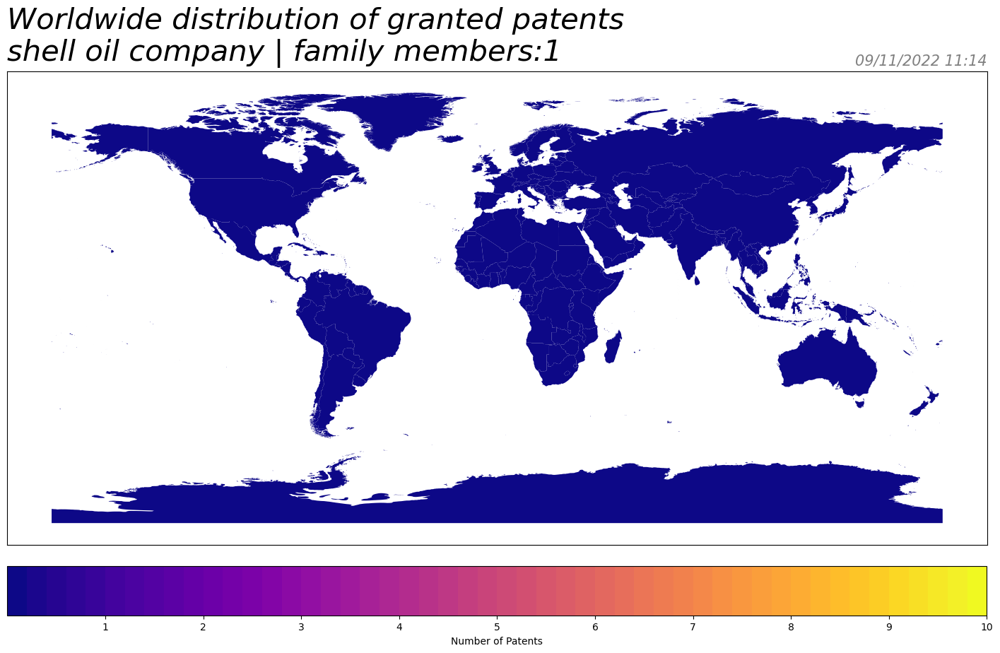

length of the family: 1 
the family: ['WO2021216638A1']
countries and their total count:
world intellectual property organization (wipo): 1 

None


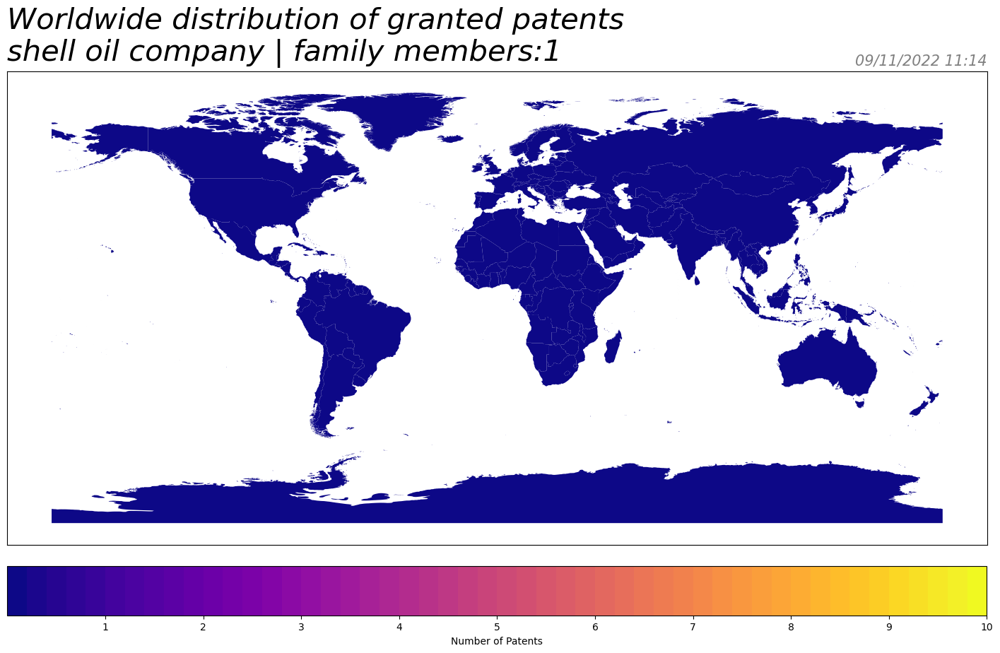

length of the family: 1 
the family: ['WO2022002810A1']
countries and their total count:
world intellectual property organization (wipo): 1 

None


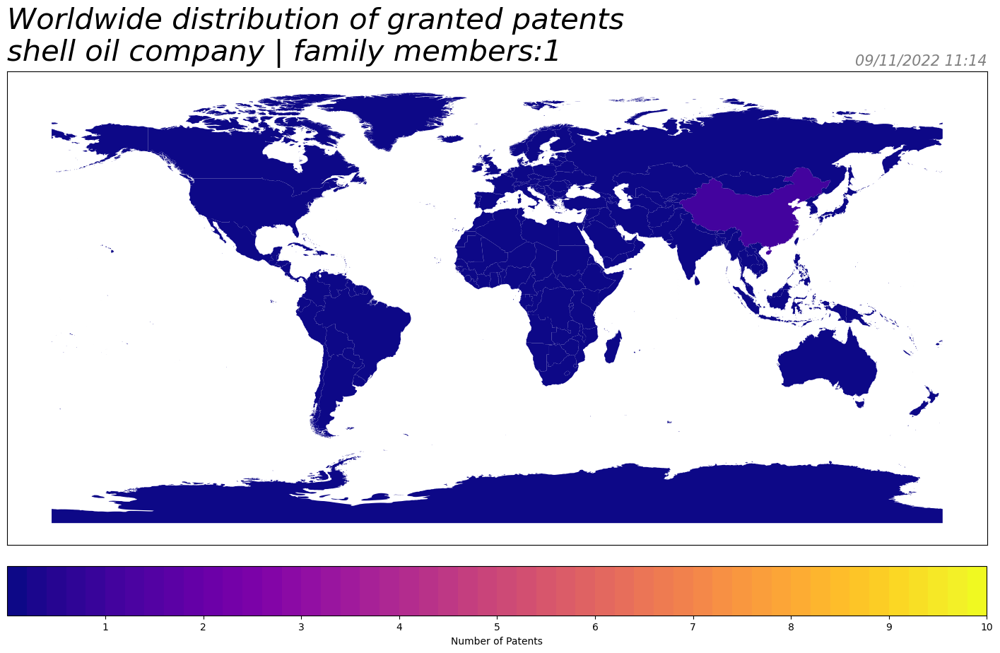

length of the family: 1 
the family: ['CN205934968U']
countries and their total count:
china: 1 

None


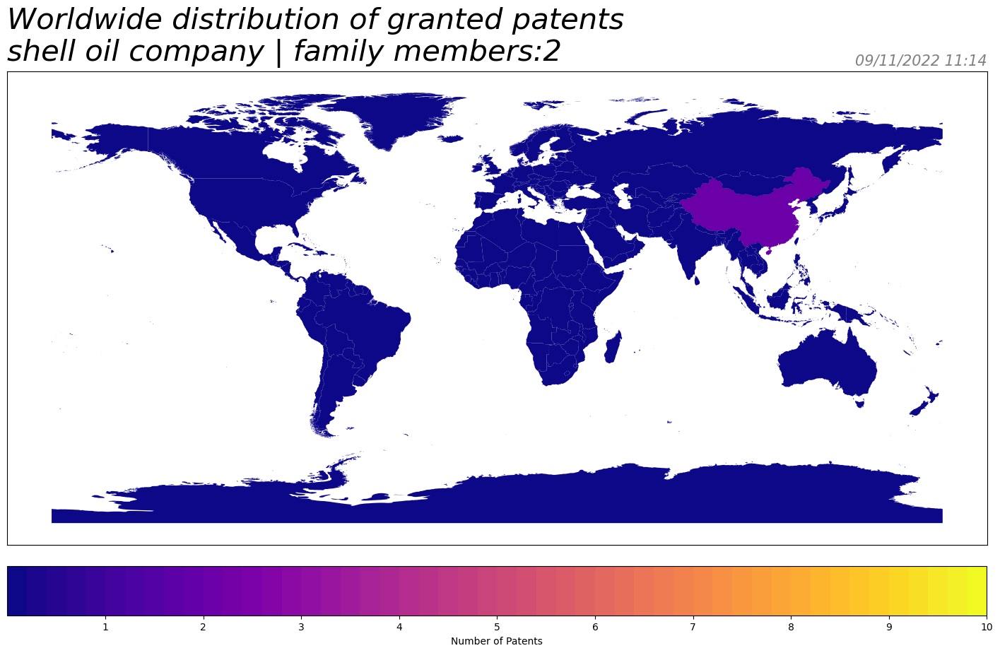

length of the family: 2 
the family: ['CN106088154A', 'CN106088154B']
countries and their total count:
china: 2 

None


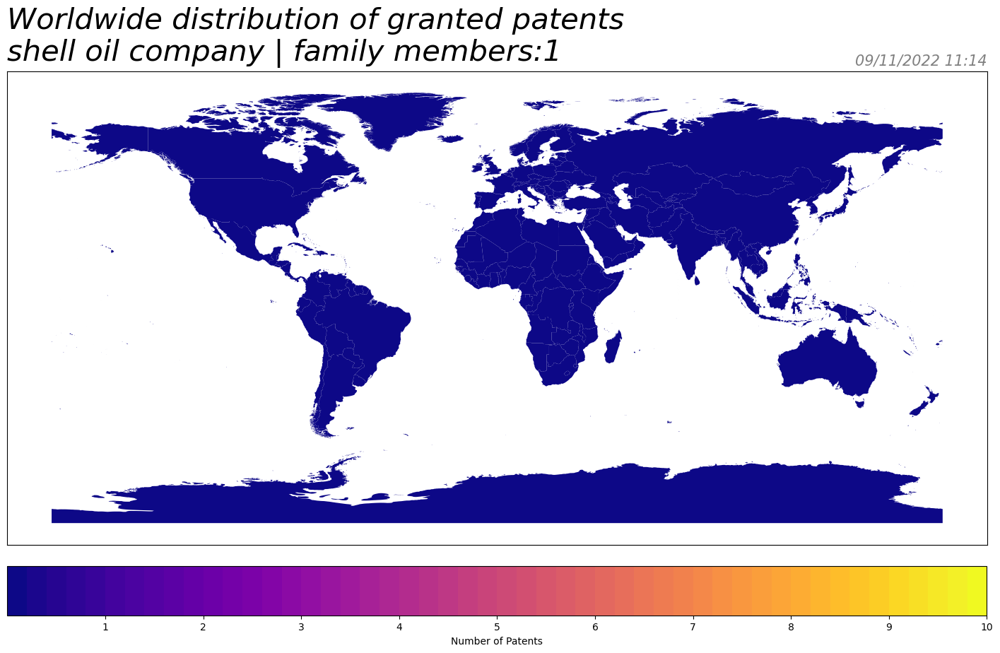

length of the family: 1 
the family: ['WO2021119235A1']
countries and their total count:
world intellectual property organization (wipo): 1 

None


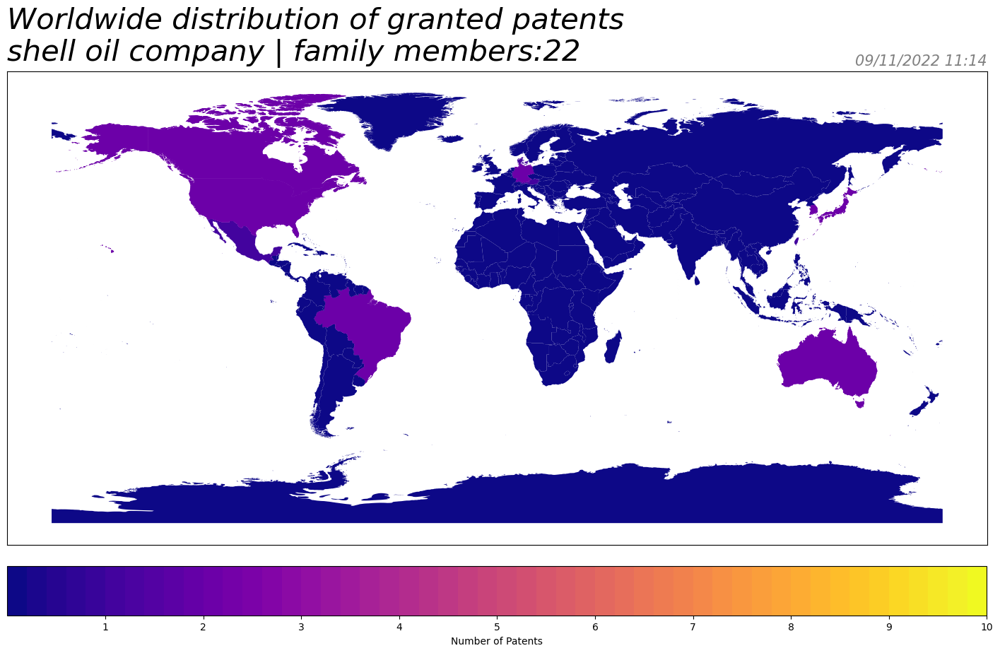

length of the family: 22 
the family: ['AU2002336664B2', 'AT299403T', 'AU2002336664C1', 'BR200213511A', 'BRPI0213511B1', 'CA2462215A1', 'CA2462215C', 'DE60205038D1', 'DE60205038T2', 'DK1467826T3', 'EP1467826A1', 'EP1467826B1', 'EP1467826B8', 'JP04509558B2', 'JP2005506902A', 'KR2004048428A', 'KR925129B1', 'MX2004003712A', 'TW564192B', 'US20040126190A1', 'US6951436B2', 'WO2003035290A1']
countries and their total count:
australia: 2 
austria: 1 
brazil: 2 
canada: 2 
denmark: 1 
germany: 2 
japan: 2 
korea (south): 2 
mexico: 1 
taiwan: 1 
united states of america: 2 
european patent office: 3 
world intellectual property organization (wipo): 1 

None


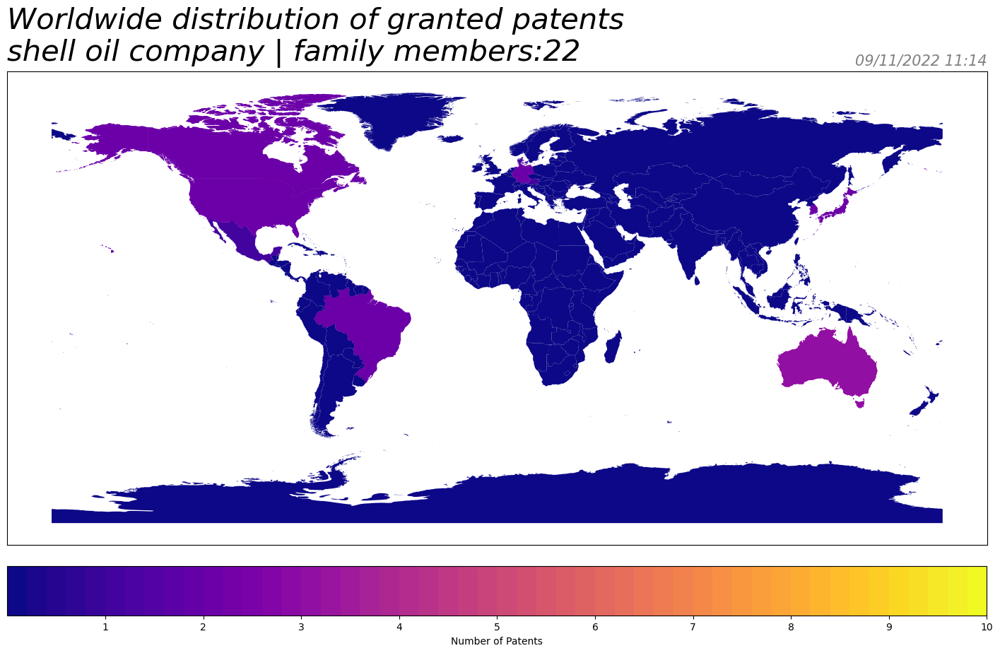

length of the family: 22 
the family: ['CA2463053C', 'AT342138T', 'AU2002365145A1', 'AU2002365145B2', 'AU2002365145C1', 'BR200213512A', 'BRPI0213512B1', 'CA2463053A1', 'DE60215378D1', 'DE60215378T2', 'DK1446239T3', 'EP1446239A2', 'EP1446239B1', 'JP04344803B2', 'JP2005512791A', 'KR2004048991A', 'KR925130B1', 'MX2004003716A', 'US20040120771A1', 'US6962466B2', 'WO2003053603A2', 'WO2003053603A3']
countries and their total count:
australia: 3 
austria: 1 
brazil: 2 
canada: 2 
denmark: 1 
germany: 2 
japan: 2 
korea (south): 2 
mexico: 1 
united states of america: 2 
european patent office: 2 
world intellectual property organization (wipo): 2 

None


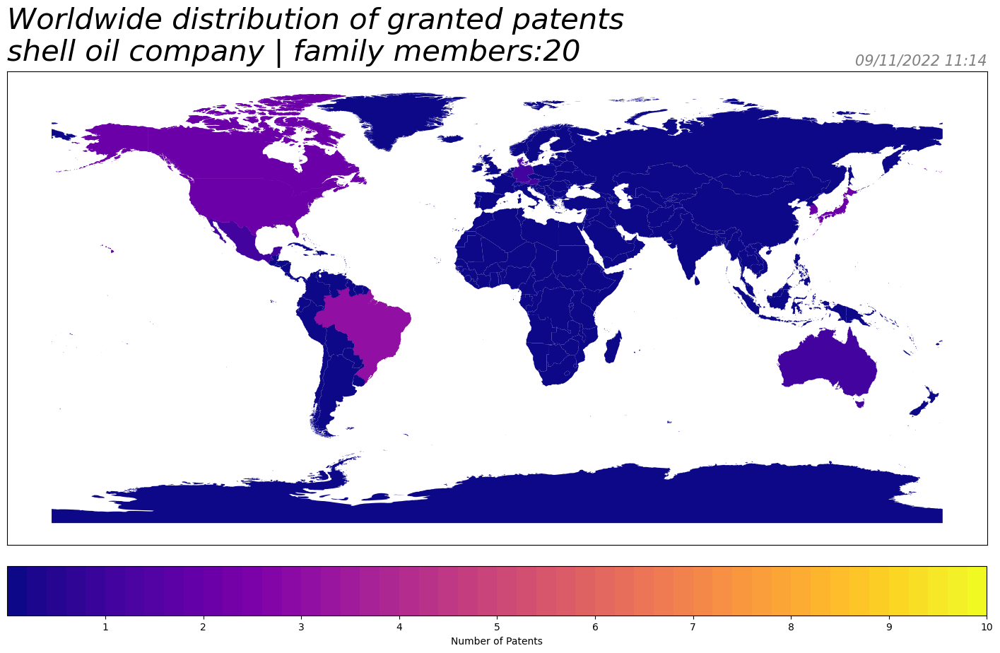

length of the family: 20 
the family: ['CA2463108A1', 'AT402294T', 'AU2002359299B2', 'BR200213513A', 'BRPI0213513B1', 'BRPI0213513B8', 'CA2463108C', 'DE60227826D1', 'DK1438462T3', 'EP1438462A2', 'EP1438462B1', 'JP04344795B2', 'JP2005516751A', 'KR2004048973A', 'KR900892B1', 'MX2004003711A', 'US20040120772A1', 'US6854929B2', 'WO2003035987A2', 'WO2003035987A3']
countries and their total count:
australia: 1 
austria: 1 
brazil: 3 
canada: 2 
denmark: 1 
germany: 1 
japan: 2 
korea (south): 2 
mexico: 1 
united states of america: 2 
european patent office: 2 
world intellectual property organization (wipo): 2 

None


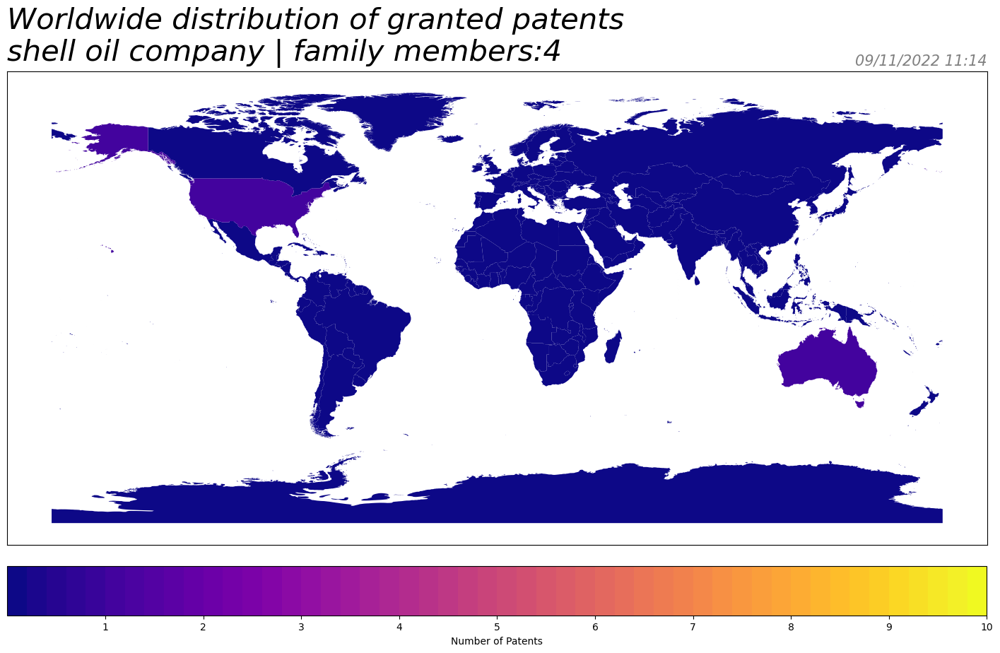

length of the family: 4 
the family: ['WO2003051546A2', 'AU2002364942A1', 'US20030110794A1', 'WO2003051546A3']
countries and their total count:
australia: 1 
united states of america: 1 
world intellectual property organization (wipo): 2 

None


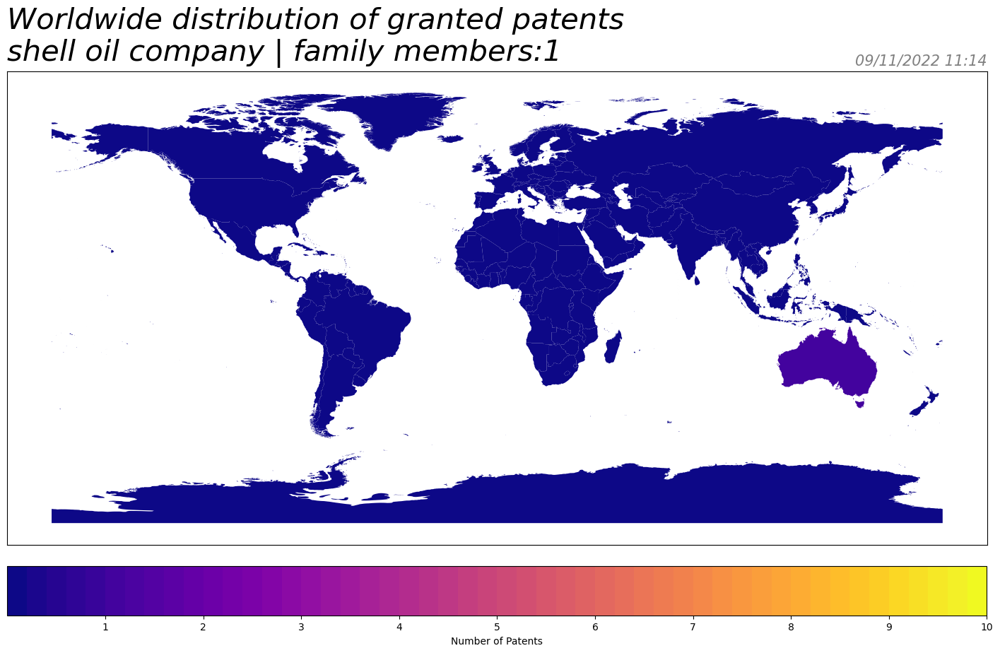

length of the family: 1 
the family: ['AU2002336664A1']
countries and their total count:
australia: 1 

None


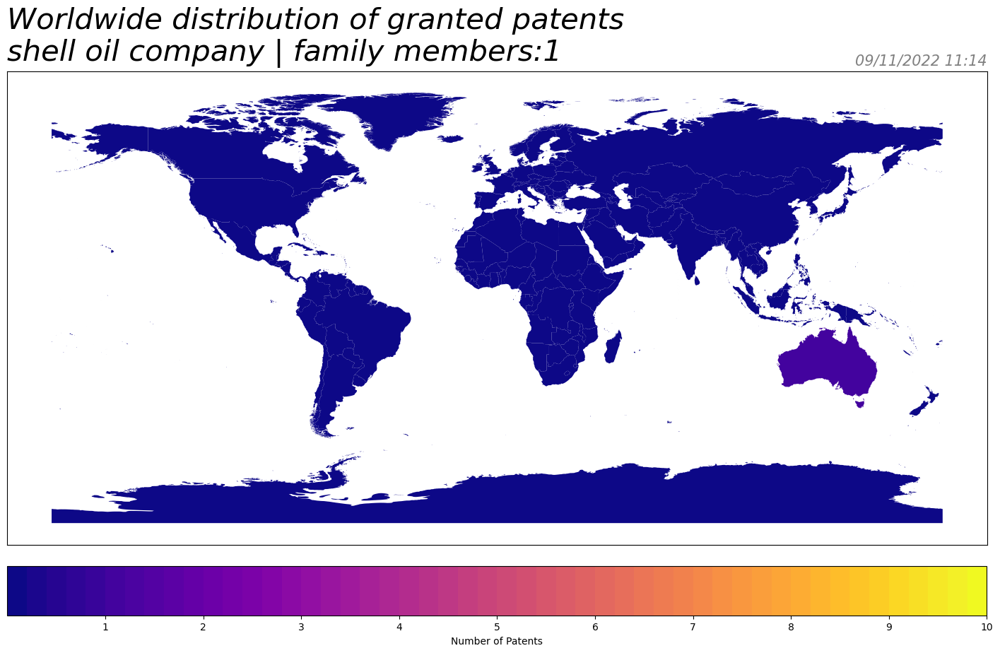

length of the family: 1 
the family: ['AU2002359299A1']
countries and their total count:
australia: 1 

None


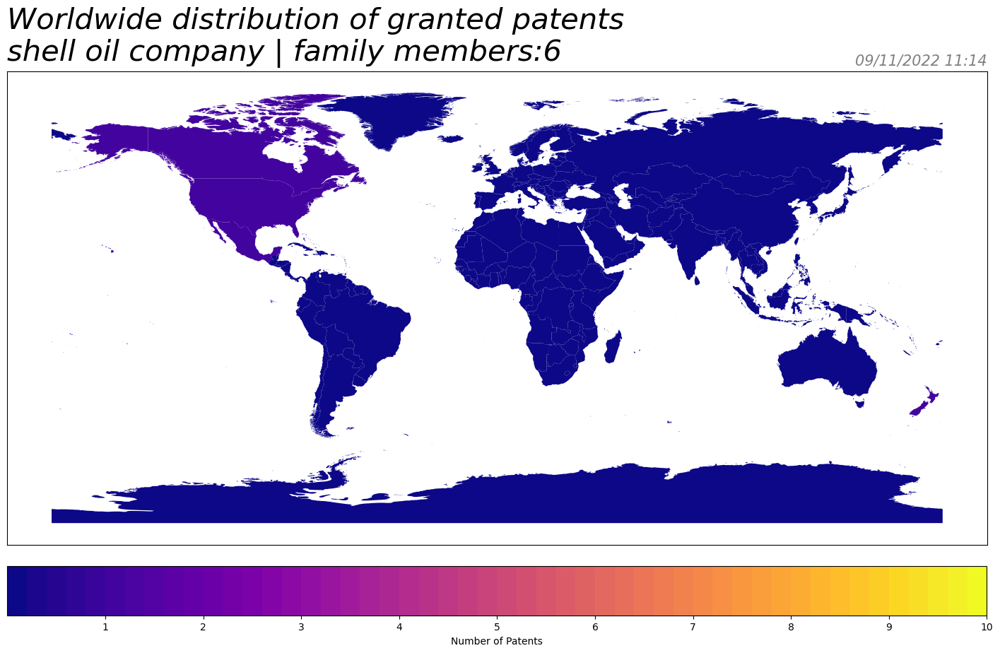

length of the family: 6 
the family: ['US20050116198A1', 'CA2472346A1', 'EP1456323A1', 'MX2004004427A', 'NZ533407A', 'WO2003040258A1']
countries and their total count:
canada: 1 
mexico: 1 
new zealand: 1 
united states of america: 1 
european patent office: 1 
world intellectual property organization (wipo): 1 

None


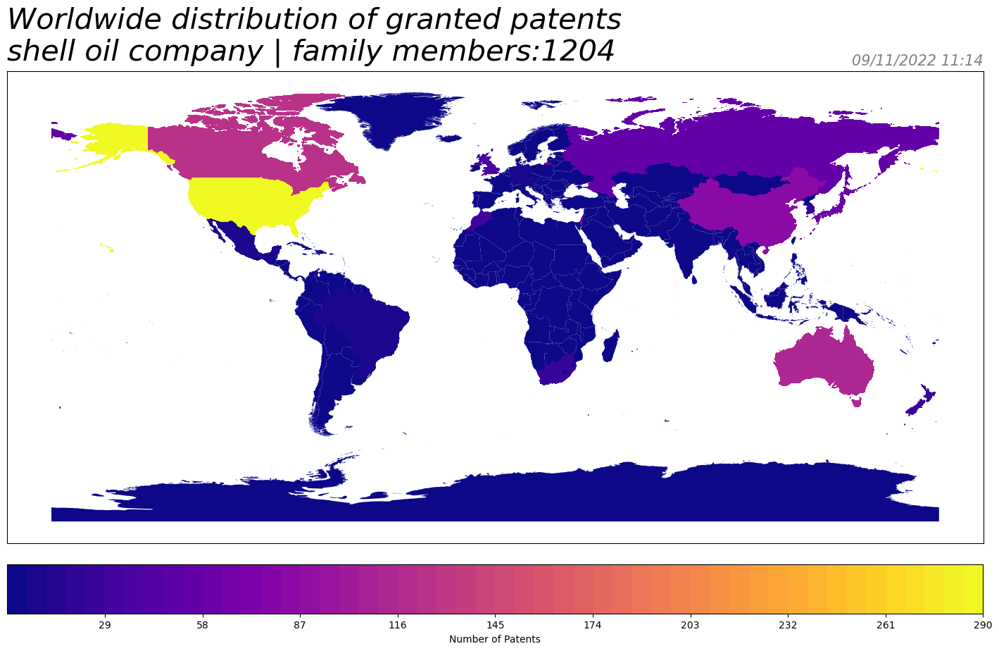

length of the family: 1204 
the family: ['AU2006340864B2', 'AT427410T', 'AT434713T', 'AT435964T', 'AT437290T', 'AT463658T', 'AT499428T', 'AU2006239886A1', 'AU2006239886B2', 'AU2006239958A1', 'AU2006239958B2', 'AU2006239961A1', 'AU2006239961B2', 'AU2006239962A1', 'AU2006239962B2', 'AU2006239962B8', 'AU2006239963A1', 'AU2006239963B2', 'AU2006239988A1', 'AU2006239988B2', 'AU2006239996A1', 'AU2006239996B2', 'AU2006239997A1', 'AU2006239997B2', 'AU2006239999A1', 'AU2006239999B2', 'AU2006240033A1', 'AU2006240033B2', 'AU2006240043A1', 'AU2006240043B2', 'AU2006240173A1', 'AU2006240173B2', 'AU2006240175A1', 'AU2006240175B2', 'AU2006306404A1', 'AU2006306404B2', 'AU2006306411A1', 'AU2006306411B2', 'AU2006306412A1', 'AU2006306412B2', 'AU2006306414A1', 'AU2006306414B2', 'AU2006306471A1', 'AU2006306471B2', 'AU2006306472A1', 'AU2006306472B2', 'AU2006306475A1', 'AU2006306475B2', 'AU2006306476A1', 'AU2006306476B2', 'AU2006340864A1', 'AU2006340864B9', 'AU2007240346A1', 'AU2007240346B2', 'AU2007240353A1',

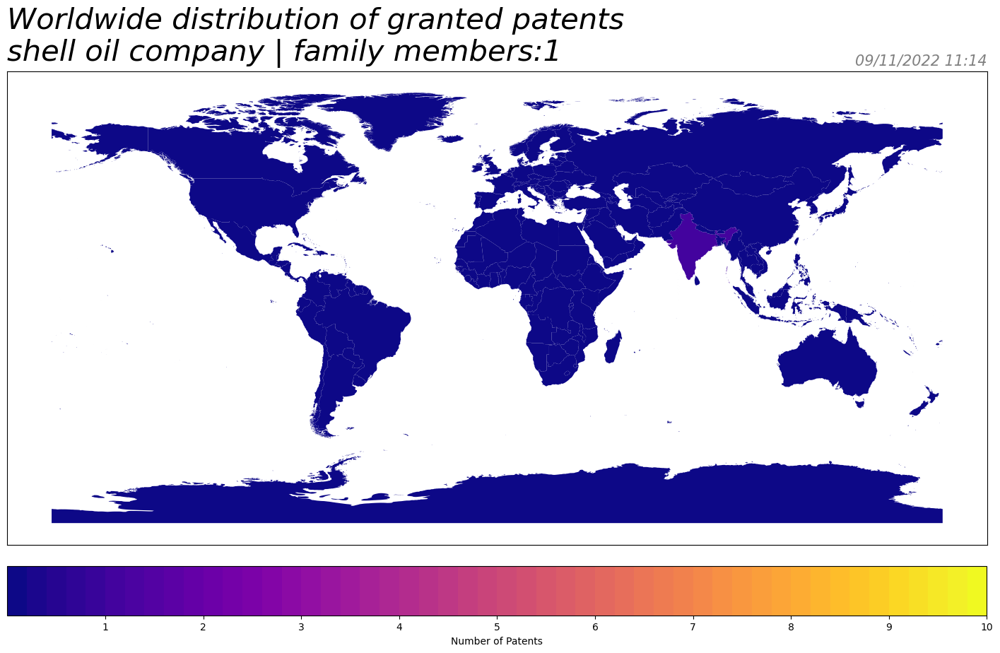

length of the family: 1 
the family: ['IN200802610P4']
countries and their total count:
india: 1 

None


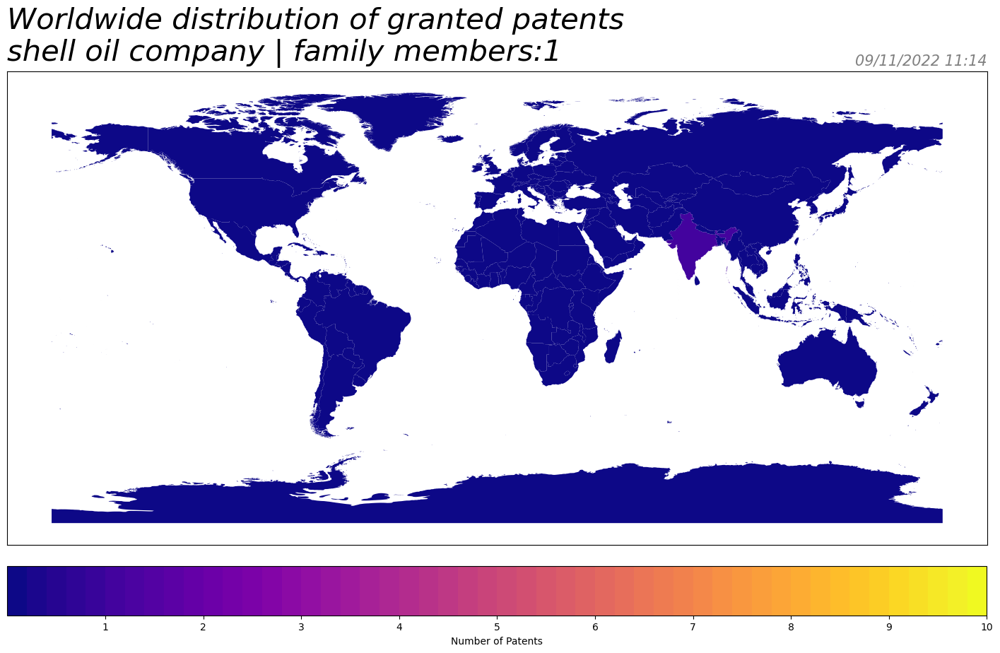

length of the family: 1 
the family: ['IN200805642P4']
countries and their total count:
india: 1 

None


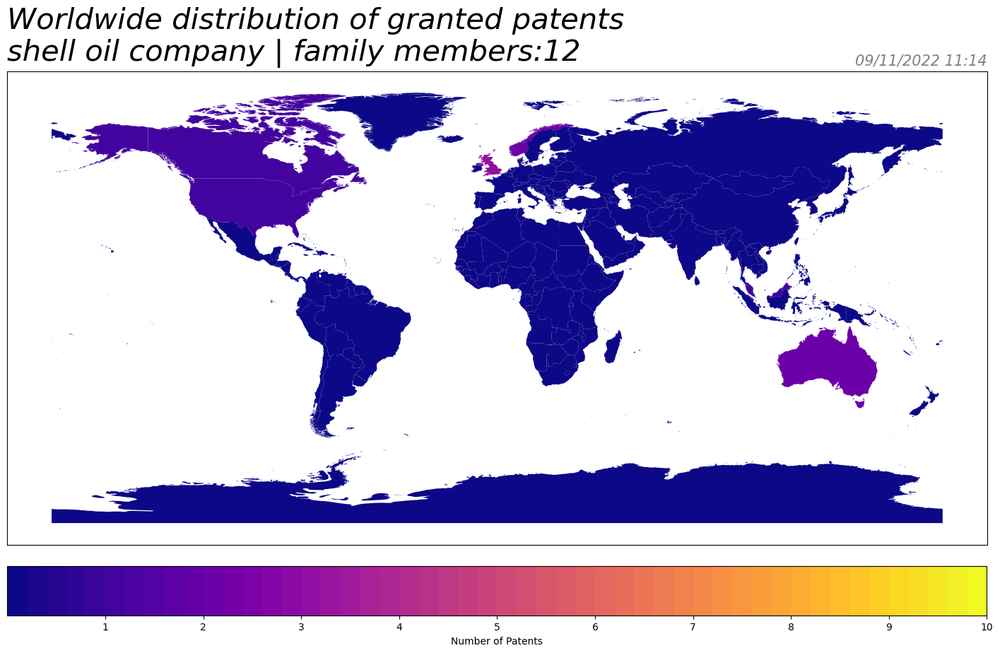

length of the family: 12 
the family: ['GB2457210B', 'AU2008206913A1', 'AU2008206913B2', 'CA2673412A1', 'GB200910578D0', 'GB2457210A', 'MY153029A', 'NO200902867L', 'NO341093B1', 'US20110139462A1', 'WO2008087174A2', 'WO2008087174A3']
countries and their total count:
australia: 2 
canada: 1 
malaysia: 1 
norway: 2 
united kingdom: 3 
united states of america: 1 
world intellectual property organization (wipo): 2 

None


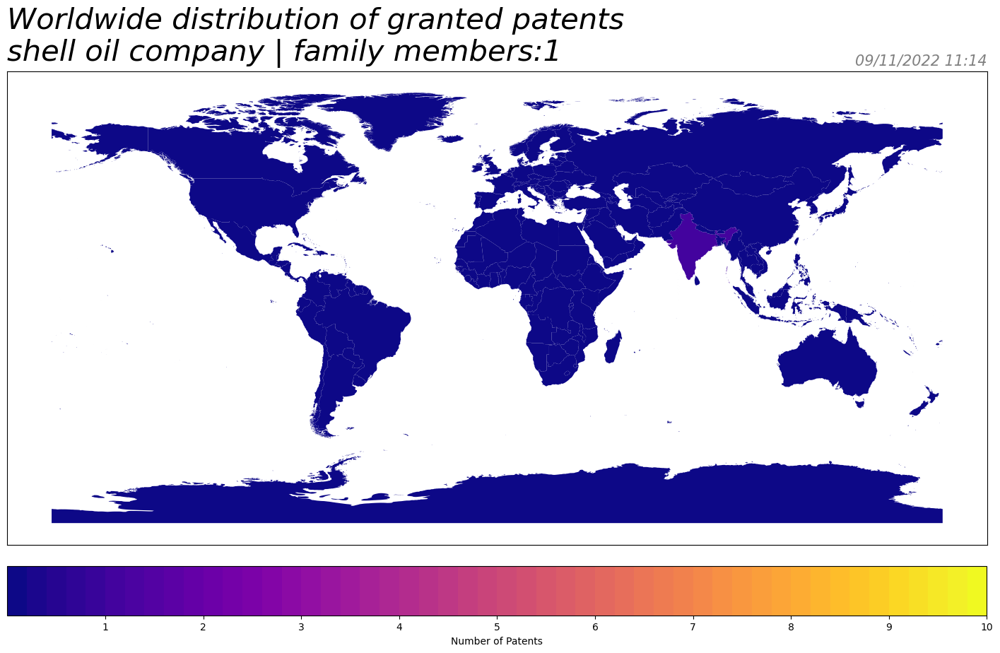

length of the family: 1 
the family: ['IN200906206P4']
countries and their total count:
india: 1 

None


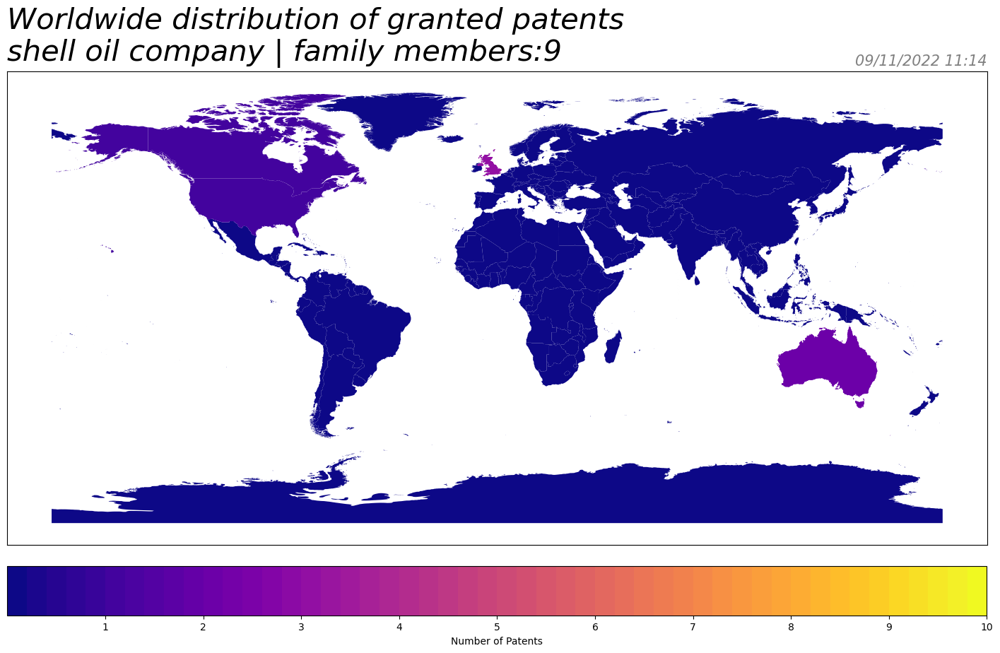

length of the family: 9 
the family: ['US20110046934A1', 'AU2008292169A1', 'AU2008292169B2', 'CA2695137A1', 'GB201001835D0', 'GB2464643A', 'GB2464643B', 'WO2009027420A2', 'WO2009027420A3']
countries and their total count:
australia: 2 
canada: 1 
united kingdom: 3 
united states of america: 1 
world intellectual property organization (wipo): 2 

None


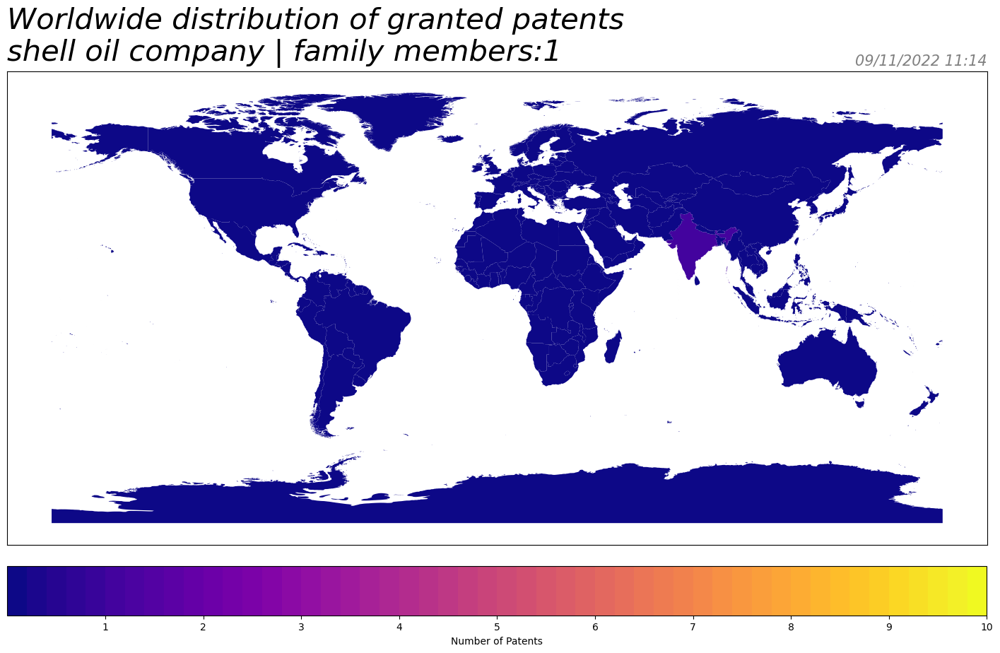

length of the family: 1 
the family: ['IN201002696P4']
countries and their total count:
india: 1 

None


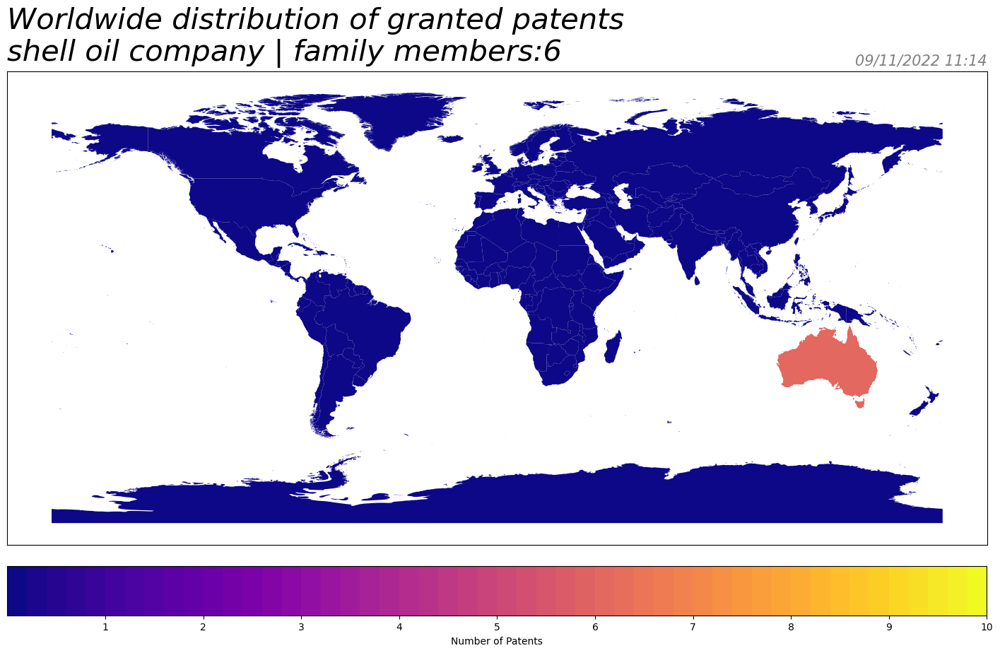

length of the family: 6 
the family: ['AU2012203086B2', 'AU2012203086A1', 'AU2012203086A8', 'AU2012203086B8', 'AU2012203096A1', 'AU2012203096B2']
countries and their total count:
australia: 6 

None


In [97]:
#plot for only granted patents
plot_worldmap_for_each_family(data_granted_total,"granted")

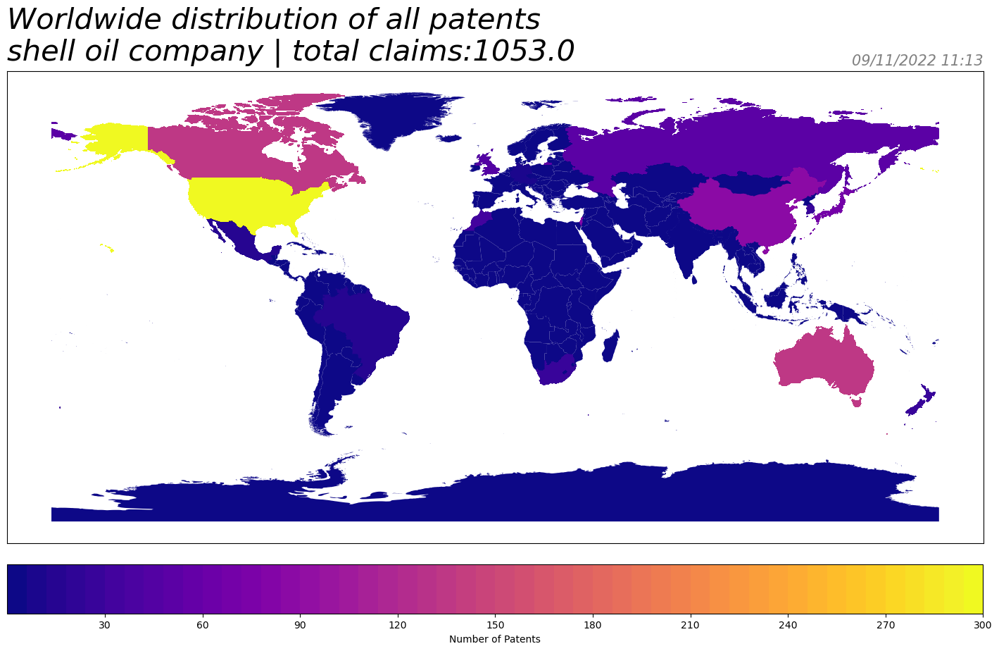

In [96]:
if merged_all is not None:
    plot_worldmap(merged_all,None,"all")
else:
    print("WARNING: no patents exists using this filter")

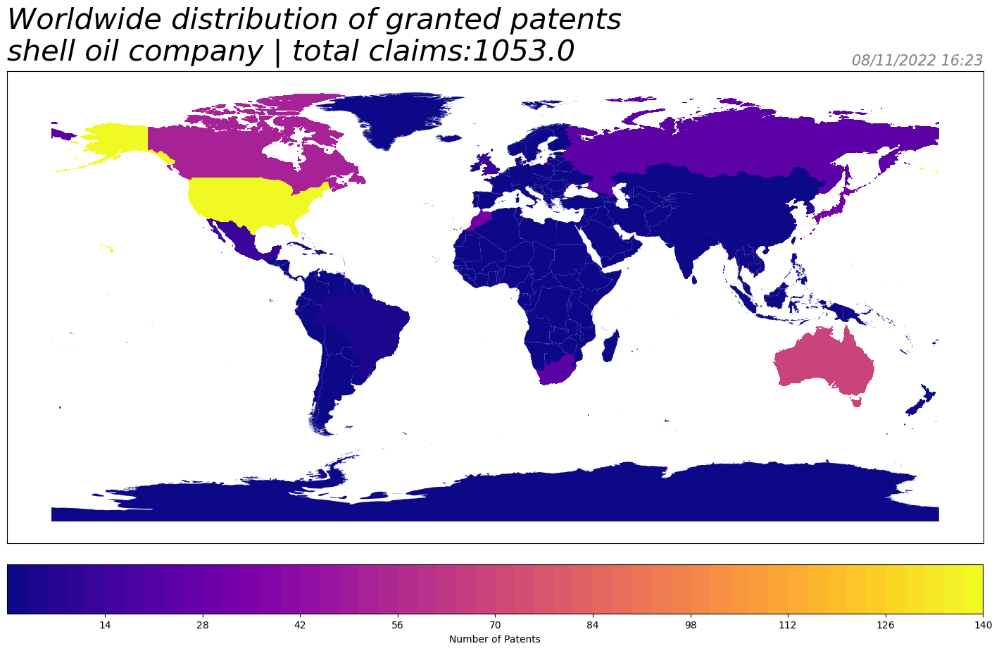

In [91]:
if merged_granted is not None:
    plot_worldmap(merged_granted,None,"granted")
else:
     print("WARNING: no patents are granted using this filter")

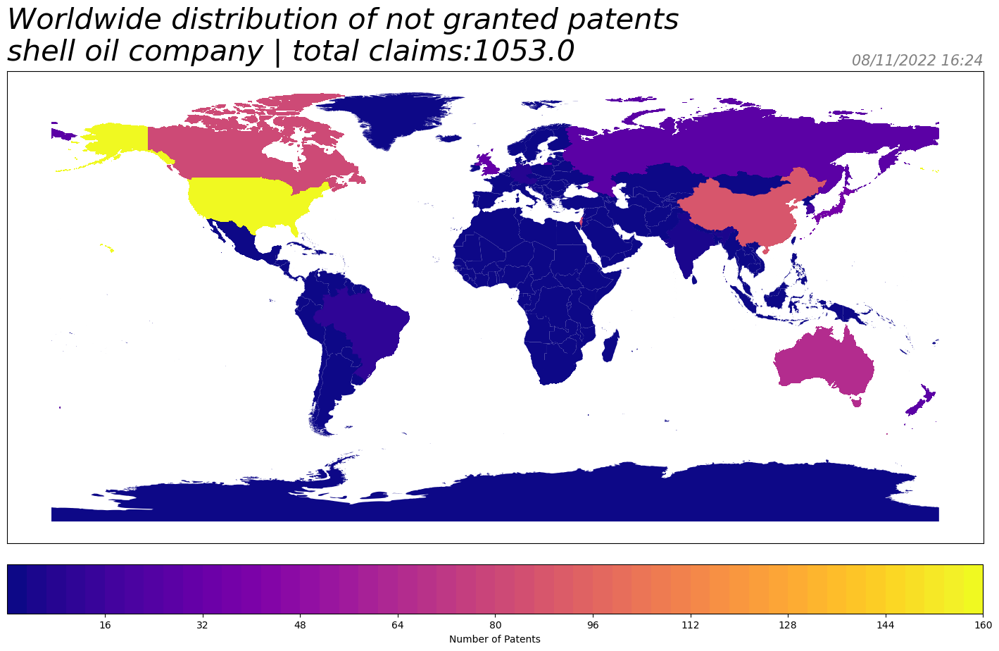

In [92]:
if merged_not_granted is not None:
    plot_worldmap(merged_not_granted,None,"not granted")
else:
     print("WARNING: no patents are not-granted using this filter")

In [93]:
def plot_worldmap_for_each_family(df,status):
    if "total_of_publication_number" in df.columns:
        df.drop("total_of_publication_number",axis = 1, inplace = True)
    families = data_all_total["inpadoc_family_members"].unique()
    for i in families:
        if i is NA:
            continue
        else:
            
            situational_data = df[df["inpadoc_family_members"]== i]
            #create column with aggregated count of patents country-wise
            total_column = situational_data[situational_data['country'].values != ""]
            total_column = total_column[["publication_number","country"]].groupby('country').agg('count')
            total_column.rename(columns = {"publication_number" : "total_of_publication_number"}, inplace = True)
            total_column.reset_index(inplace = True)
            total_column["total_of_publication_number"] = total_column.apply(lambda x: NA if x["total_of_publication_number"] == 0 else x["total_of_publication_number"],axis = 1)
            situational_data = situational_data.merge(total_column, left_on = 'country', right_on = 'country', how='left')
            #data_all_total
            situational_data= world_map.merge(situational_data, left_on = 'COUNTRY', right_on = 'country', how='outer')
            situational_data['total_of_publication_number'] =situational_data['total_of_publication_number'].fillna(0)

            #create variables for text showoff
            text = [f"countries and their total count:\n"]
            unique_countries = situational_data.country.dropna().unique()
            for k in unique_countries:
                countries = k
                values = str(int(situational_data[situational_data["country"]==str(k)][["total_of_publication_number"]].agg('count')))
                text.append(f"{countries}: {values} \n")
            print(f"length of the family: {len(situational_data[situational_data['publication_number'].notnull()])} \nthe family: {i}\n{''.join(text)}\n{plot_worldmap(situational_data,situational_data,status)}")
        
    

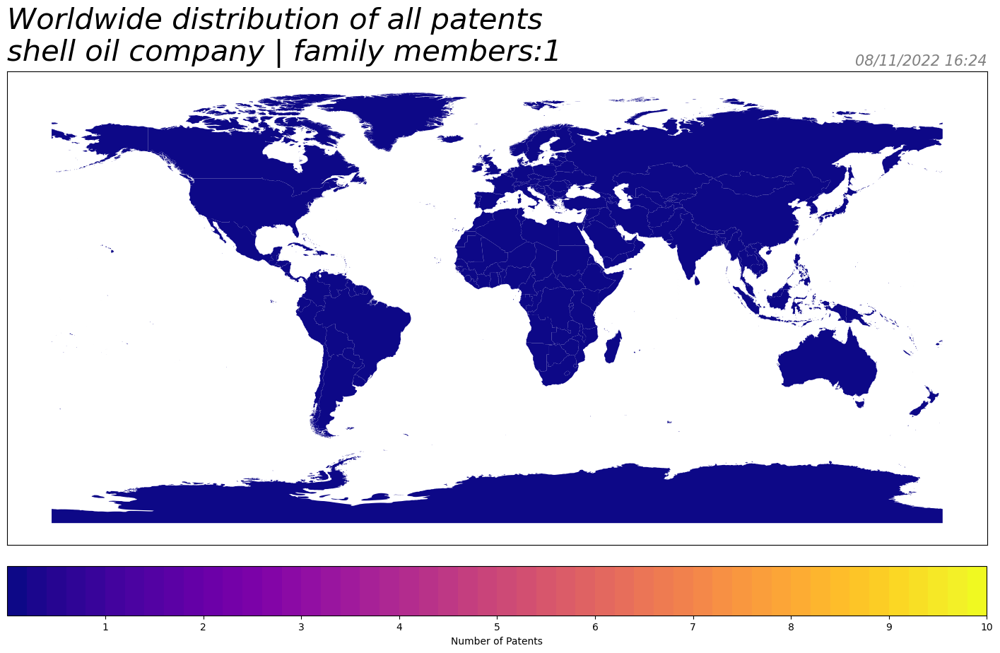

length of the family: 1 
the family: ['WO2021216638A1']
countries and their total count:
world intellectual property organization (wipo): 1 

None


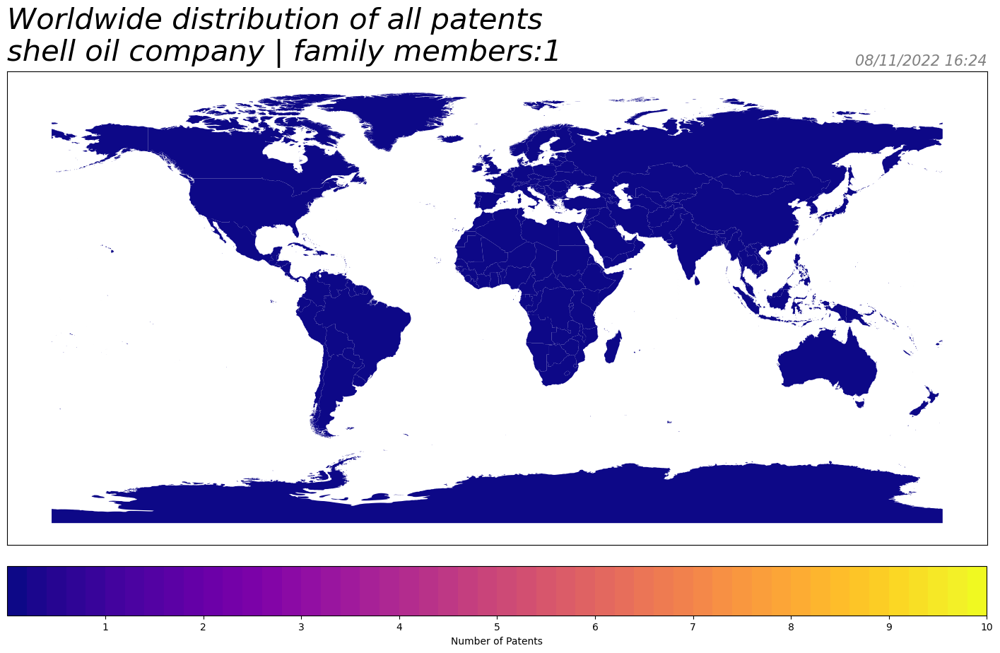

length of the family: 1 
the family: ['WO2022002810A1']
countries and their total count:
world intellectual property organization (wipo): 1 

None


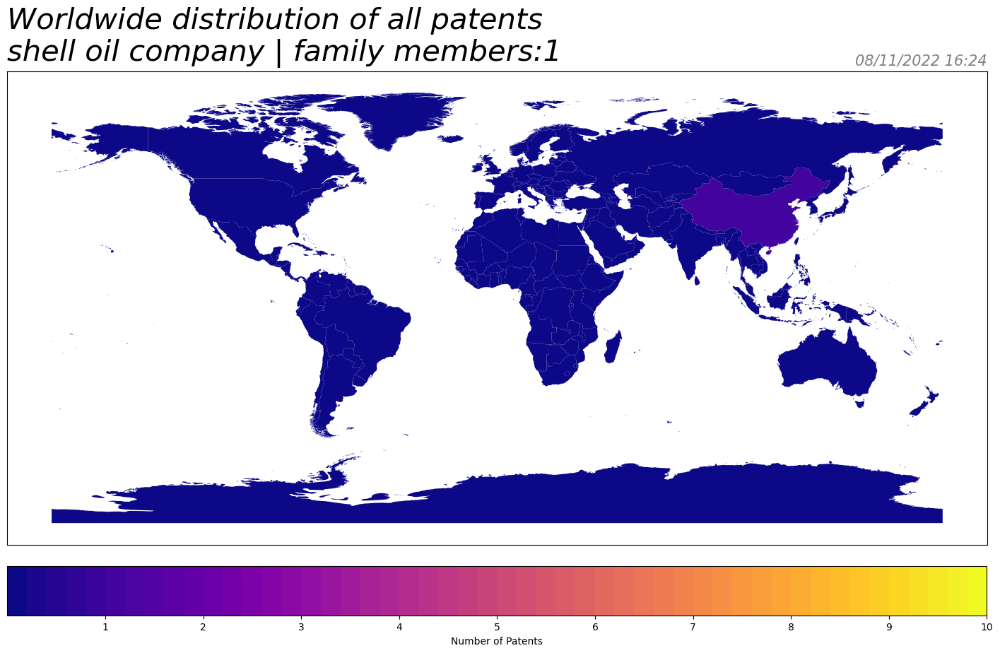

length of the family: 1 
the family: ['CN205934968U']
countries and their total count:
china: 1 

None


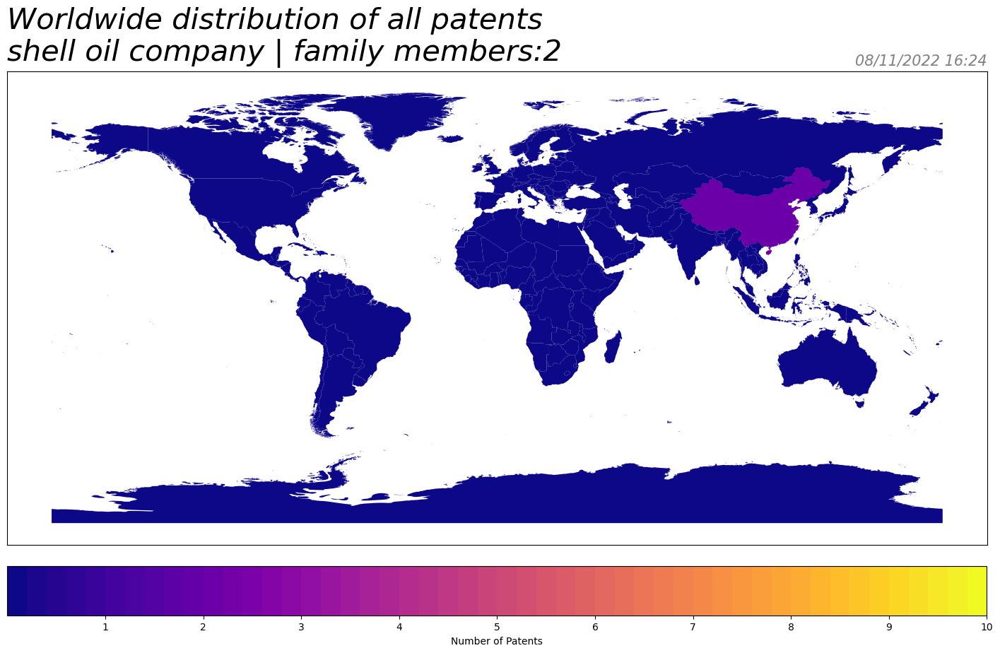

length of the family: 2 
the family: ['CN106088154A', 'CN106088154B']
countries and their total count:
china: 2 

None


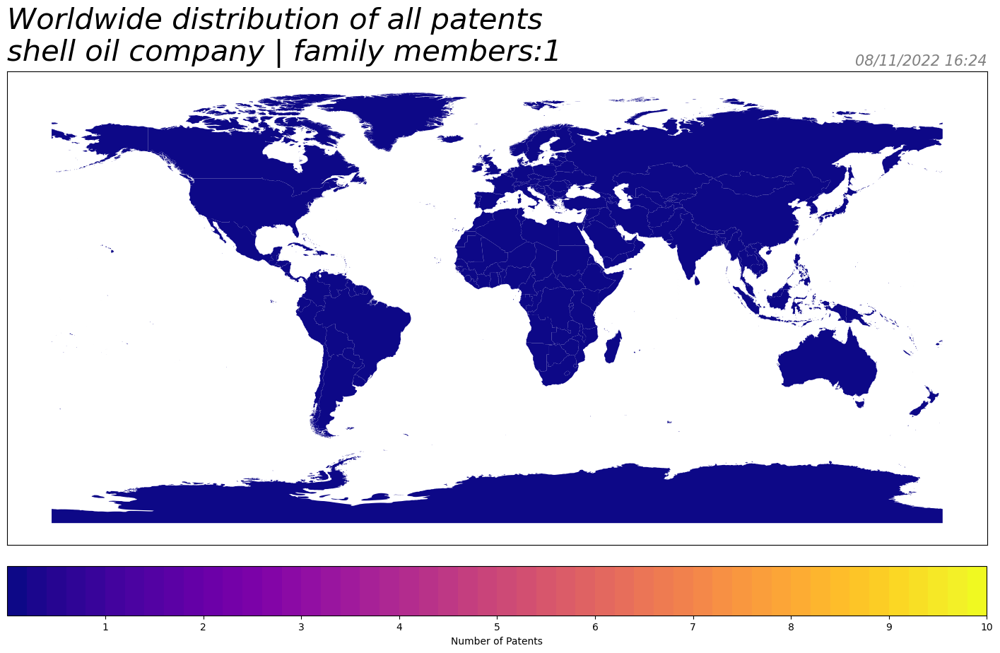

length of the family: 1 
the family: ['WO2021119235A1']
countries and their total count:
world intellectual property organization (wipo): 1 

None


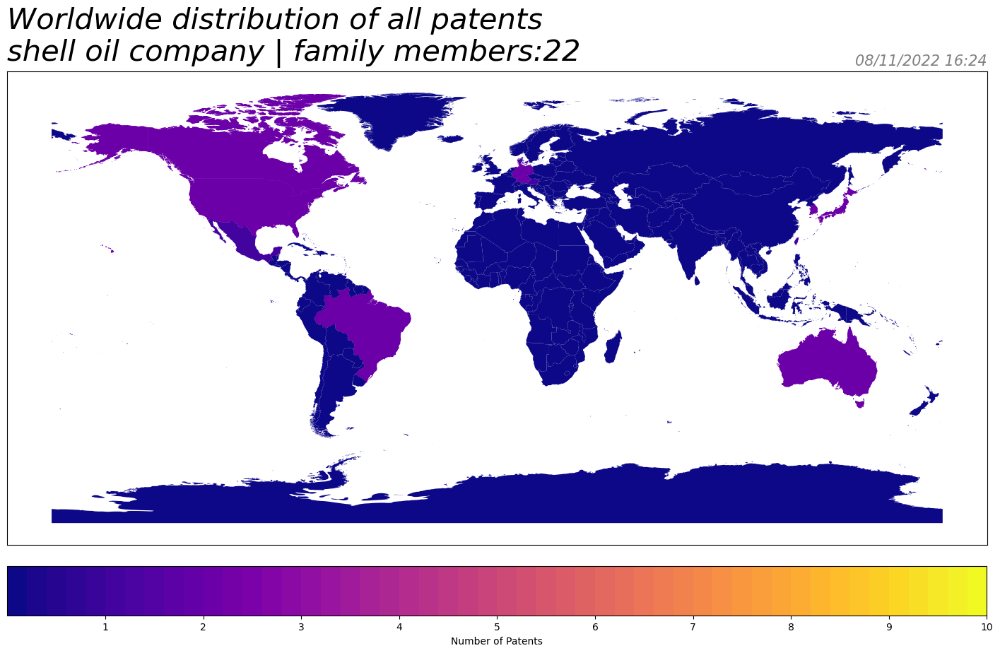

length of the family: 22 
the family: ['AU2002336664B2', 'AT299403T', 'AU2002336664C1', 'BR200213511A', 'BRPI0213511B1', 'CA2462215A1', 'CA2462215C', 'DE60205038D1', 'DE60205038T2', 'DK1467826T3', 'EP1467826A1', 'EP1467826B1', 'EP1467826B8', 'JP04509558B2', 'JP2005506902A', 'KR2004048428A', 'KR925129B1', 'MX2004003712A', 'TW564192B', 'US20040126190A1', 'US6951436B2', 'WO2003035290A1']
countries and their total count:
australia: 2 
austria: 1 
brazil: 2 
canada: 2 
denmark: 1 
germany: 2 
japan: 2 
korea (south): 2 
mexico: 1 
taiwan: 1 
united states of america: 2 
european patent office: 3 
world intellectual property organization (wipo): 1 

None


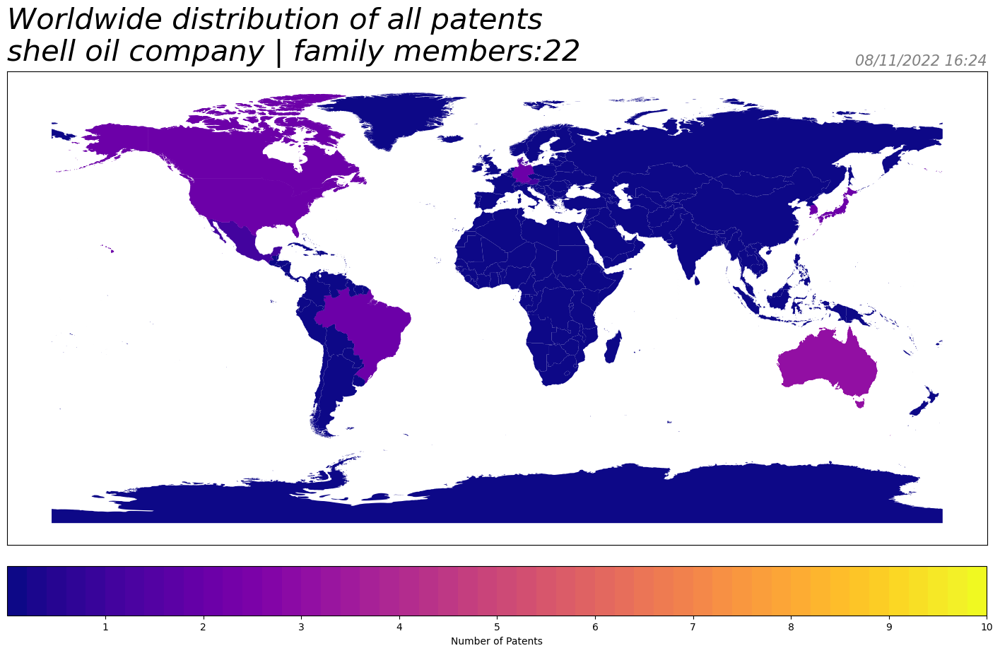

length of the family: 22 
the family: ['CA2463053C', 'AT342138T', 'AU2002365145A1', 'AU2002365145B2', 'AU2002365145C1', 'BR200213512A', 'BRPI0213512B1', 'CA2463053A1', 'DE60215378D1', 'DE60215378T2', 'DK1446239T3', 'EP1446239A2', 'EP1446239B1', 'JP04344803B2', 'JP2005512791A', 'KR2004048991A', 'KR925130B1', 'MX2004003716A', 'US20040120771A1', 'US6962466B2', 'WO2003053603A2', 'WO2003053603A3']
countries and their total count:
australia: 3 
austria: 1 
brazil: 2 
canada: 2 
denmark: 1 
germany: 2 
japan: 2 
korea (south): 2 
mexico: 1 
united states of america: 2 
european patent office: 2 
world intellectual property organization (wipo): 2 

None


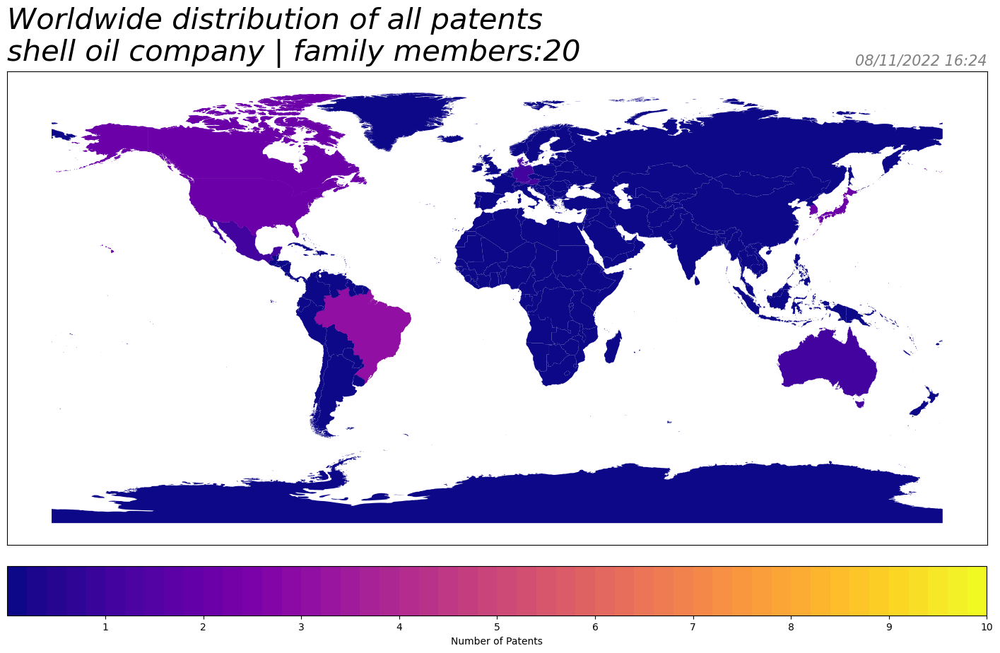

length of the family: 20 
the family: ['CA2463108A1', 'AT402294T', 'AU2002359299B2', 'BR200213513A', 'BRPI0213513B1', 'BRPI0213513B8', 'CA2463108C', 'DE60227826D1', 'DK1438462T3', 'EP1438462A2', 'EP1438462B1', 'JP04344795B2', 'JP2005516751A', 'KR2004048973A', 'KR900892B1', 'MX2004003711A', 'US20040120772A1', 'US6854929B2', 'WO2003035987A2', 'WO2003035987A3']
countries and their total count:
australia: 1 
austria: 1 
brazil: 3 
canada: 2 
denmark: 1 
germany: 1 
japan: 2 
korea (south): 2 
mexico: 1 
united states of america: 2 
european patent office: 2 
world intellectual property organization (wipo): 2 

None


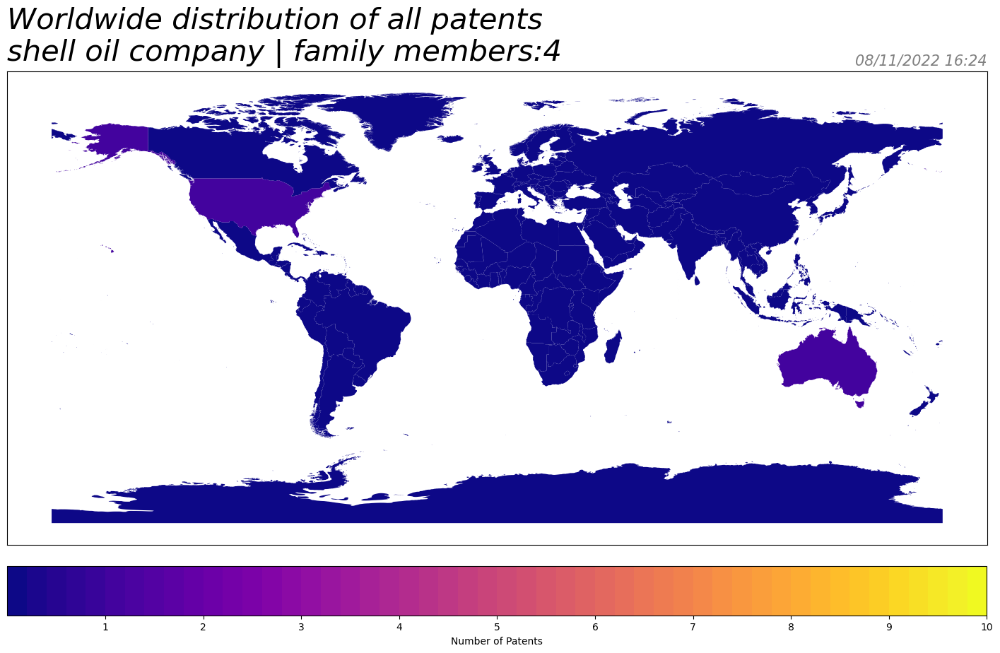

length of the family: 4 
the family: ['WO2003051546A2', 'AU2002364942A1', 'US20030110794A1', 'WO2003051546A3']
countries and their total count:
australia: 1 
united states of america: 1 
world intellectual property organization (wipo): 2 

None


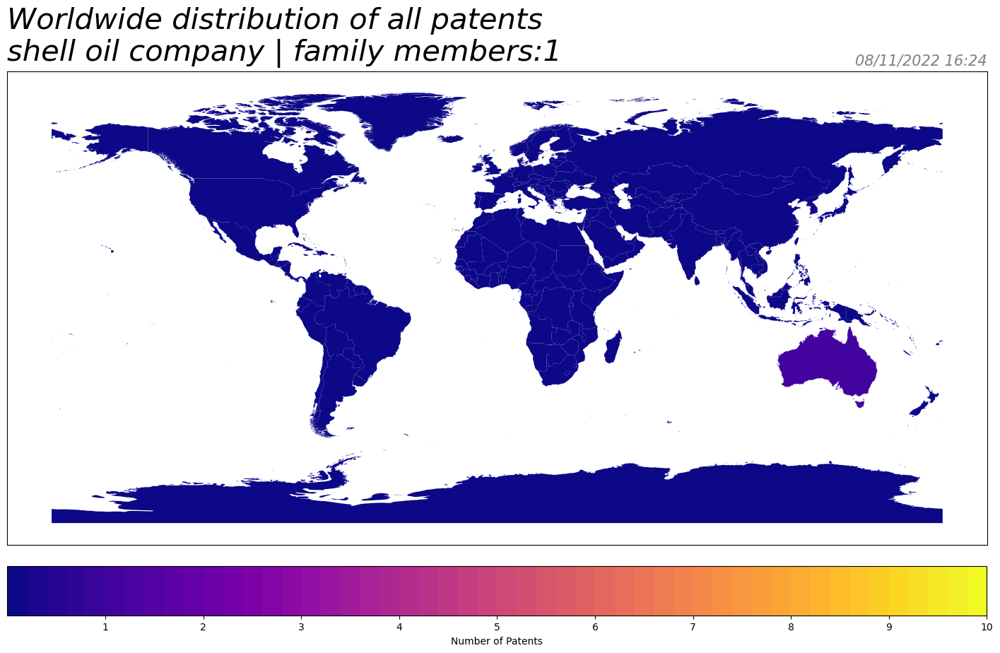

length of the family: 1 
the family: ['AU2002336664A1']
countries and their total count:
australia: 1 

None


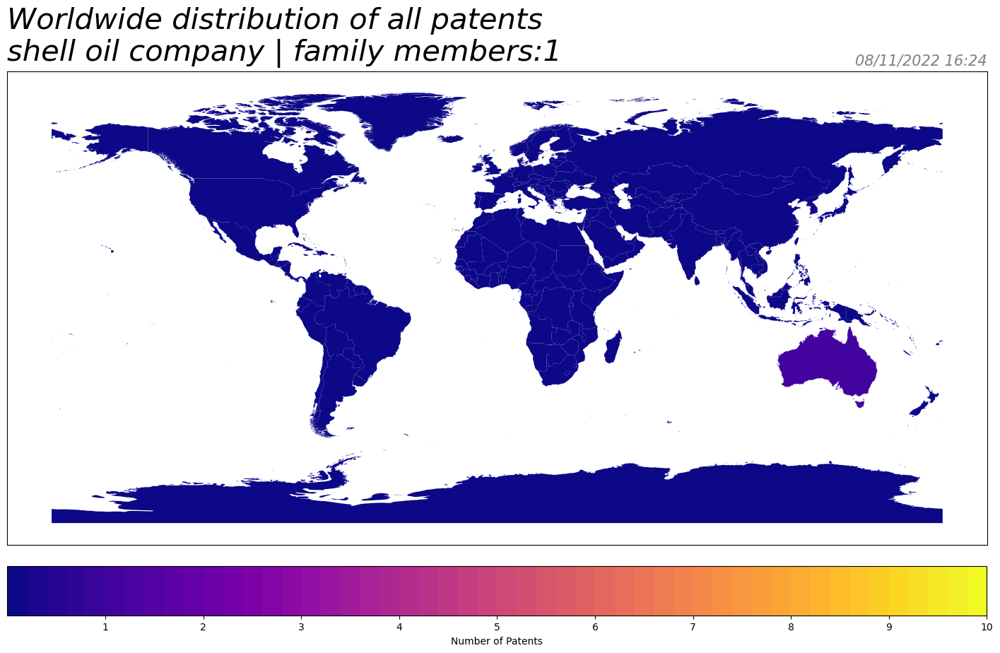

length of the family: 1 
the family: ['AU2002359299A1']
countries and their total count:
australia: 1 

None


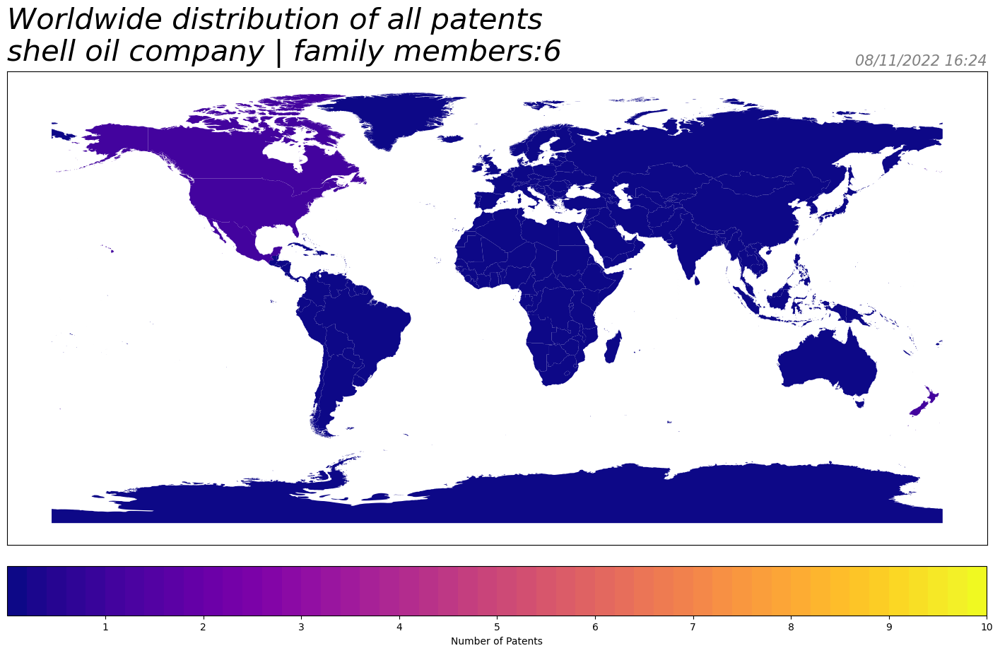

length of the family: 6 
the family: ['US20050116198A1', 'CA2472346A1', 'EP1456323A1', 'MX2004004427A', 'NZ533407A', 'WO2003040258A1']
countries and their total count:
canada: 1 
mexico: 1 
new zealand: 1 
united states of america: 1 
european patent office: 1 
world intellectual property organization (wipo): 1 

None


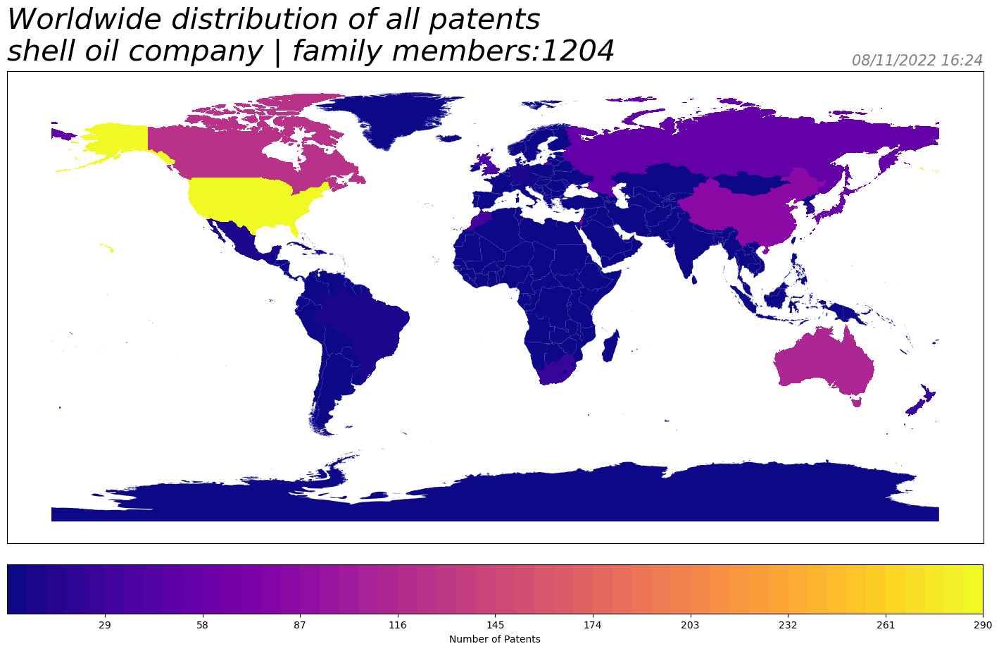

length of the family: 1204 
the family: ['AU2006340864B2', 'AT427410T', 'AT434713T', 'AT435964T', 'AT437290T', 'AT463658T', 'AT499428T', 'AU2006239886A1', 'AU2006239886B2', 'AU2006239958A1', 'AU2006239958B2', 'AU2006239961A1', 'AU2006239961B2', 'AU2006239962A1', 'AU2006239962B2', 'AU2006239962B8', 'AU2006239963A1', 'AU2006239963B2', 'AU2006239988A1', 'AU2006239988B2', 'AU2006239996A1', 'AU2006239996B2', 'AU2006239997A1', 'AU2006239997B2', 'AU2006239999A1', 'AU2006239999B2', 'AU2006240033A1', 'AU2006240033B2', 'AU2006240043A1', 'AU2006240043B2', 'AU2006240173A1', 'AU2006240173B2', 'AU2006240175A1', 'AU2006240175B2', 'AU2006306404A1', 'AU2006306404B2', 'AU2006306411A1', 'AU2006306411B2', 'AU2006306412A1', 'AU2006306412B2', 'AU2006306414A1', 'AU2006306414B2', 'AU2006306471A1', 'AU2006306471B2', 'AU2006306472A1', 'AU2006306472B2', 'AU2006306475A1', 'AU2006306475B2', 'AU2006306476A1', 'AU2006306476B2', 'AU2006340864A1', 'AU2006340864B9', 'AU2007240346A1', 'AU2007240346B2', 'AU2007240353A1',

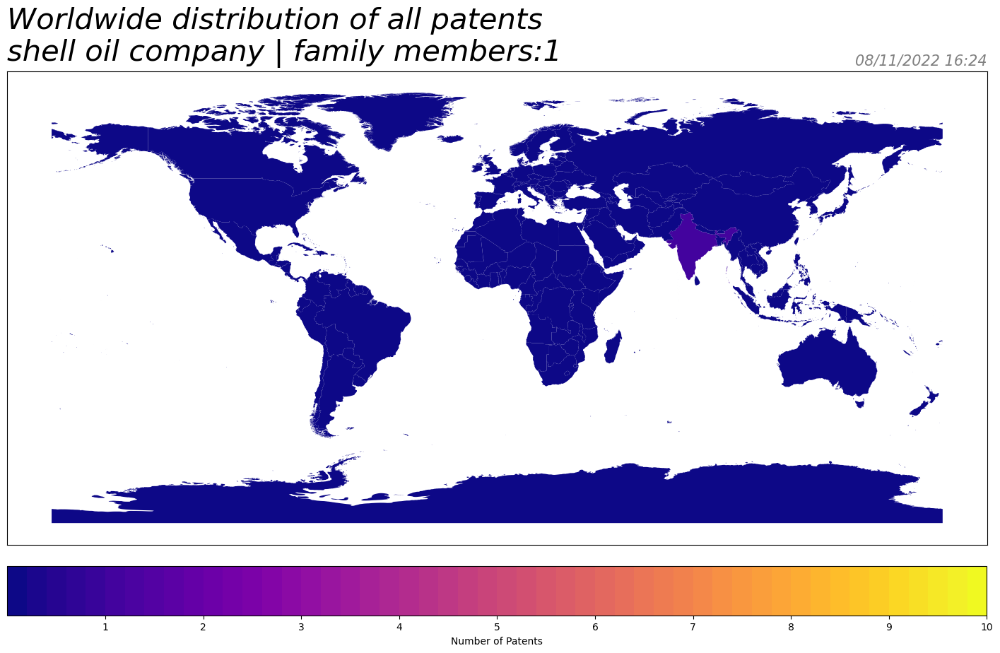

length of the family: 1 
the family: ['IN200802610P4']
countries and their total count:
india: 1 

None


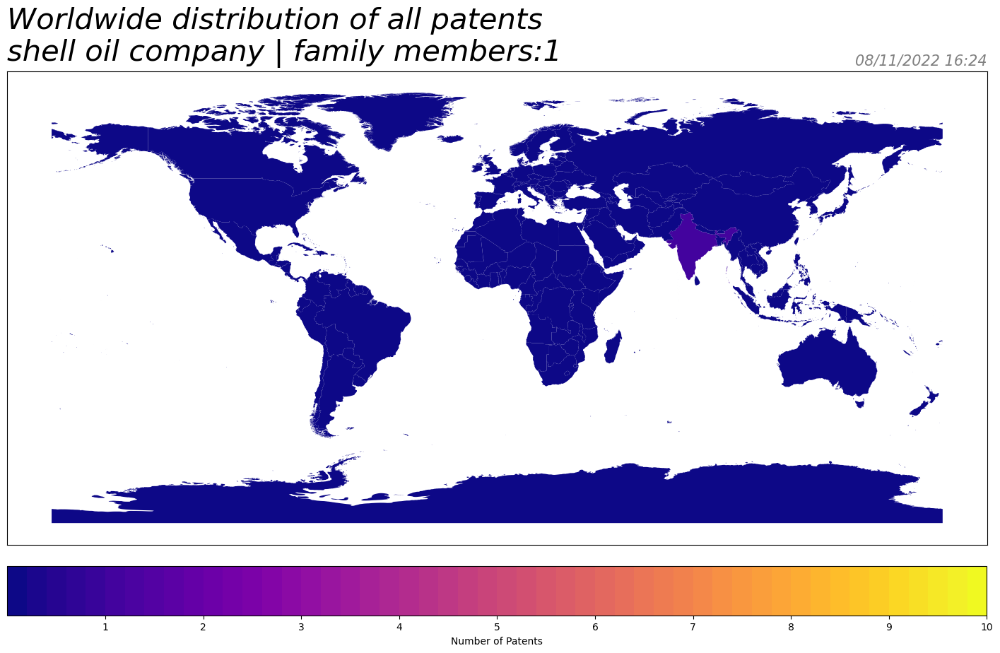

length of the family: 1 
the family: ['IN200805642P4']
countries and their total count:
india: 1 

None


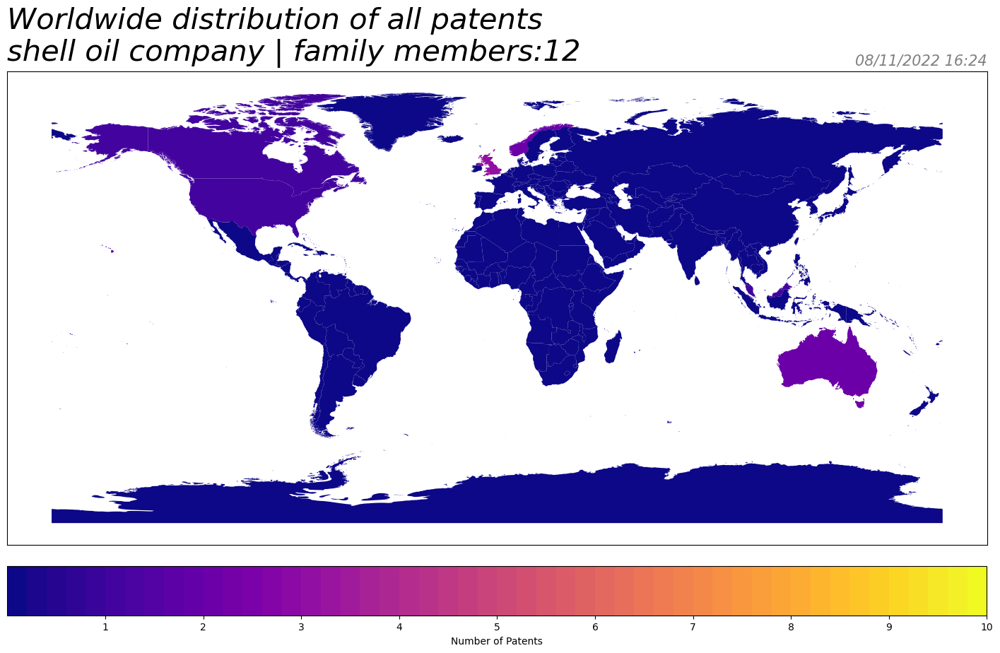

length of the family: 12 
the family: ['GB2457210B', 'AU2008206913A1', 'AU2008206913B2', 'CA2673412A1', 'GB200910578D0', 'GB2457210A', 'MY153029A', 'NO200902867L', 'NO341093B1', 'US20110139462A1', 'WO2008087174A2', 'WO2008087174A3']
countries and their total count:
australia: 2 
canada: 1 
malaysia: 1 
norway: 2 
united kingdom: 3 
united states of america: 1 
world intellectual property organization (wipo): 2 

None


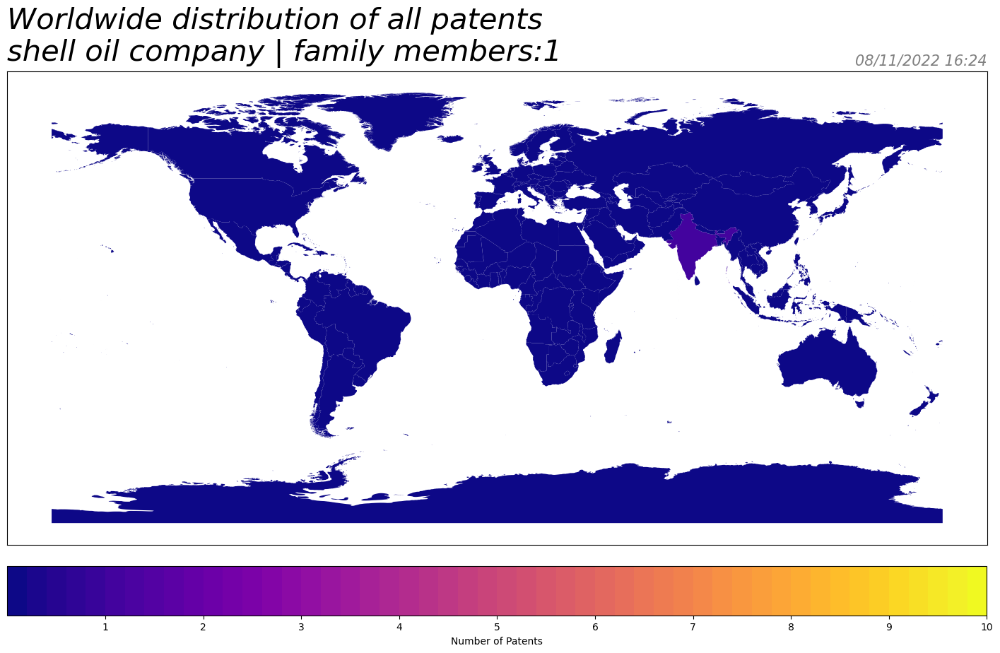

length of the family: 1 
the family: ['IN200906206P4']
countries and their total count:
india: 1 

None


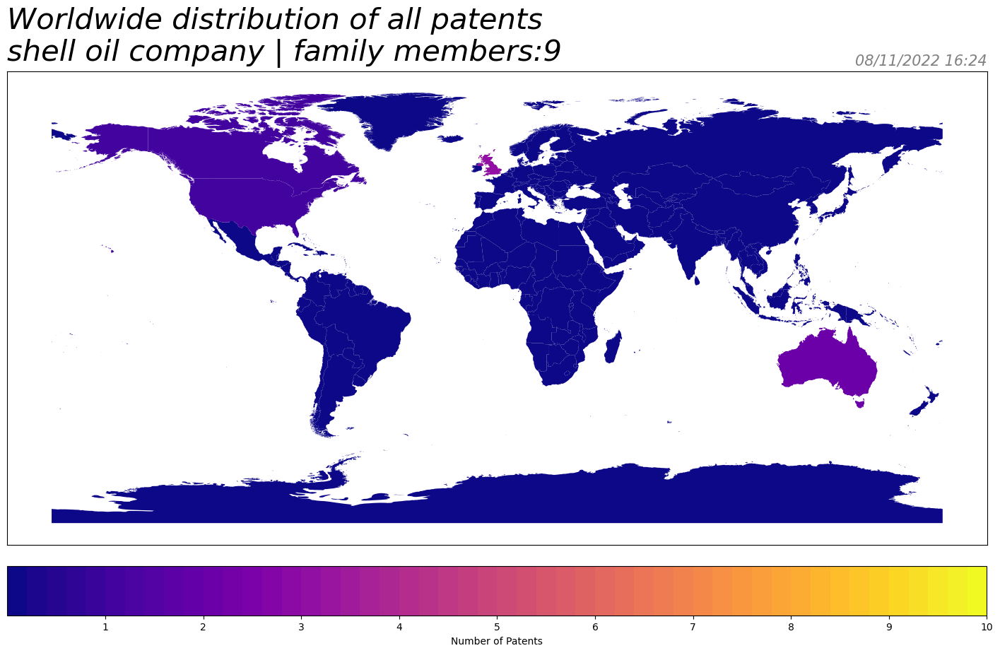

length of the family: 9 
the family: ['US20110046934A1', 'AU2008292169A1', 'AU2008292169B2', 'CA2695137A1', 'GB201001835D0', 'GB2464643A', 'GB2464643B', 'WO2009027420A2', 'WO2009027420A3']
countries and their total count:
australia: 2 
canada: 1 
united kingdom: 3 
united states of america: 1 
world intellectual property organization (wipo): 2 

None


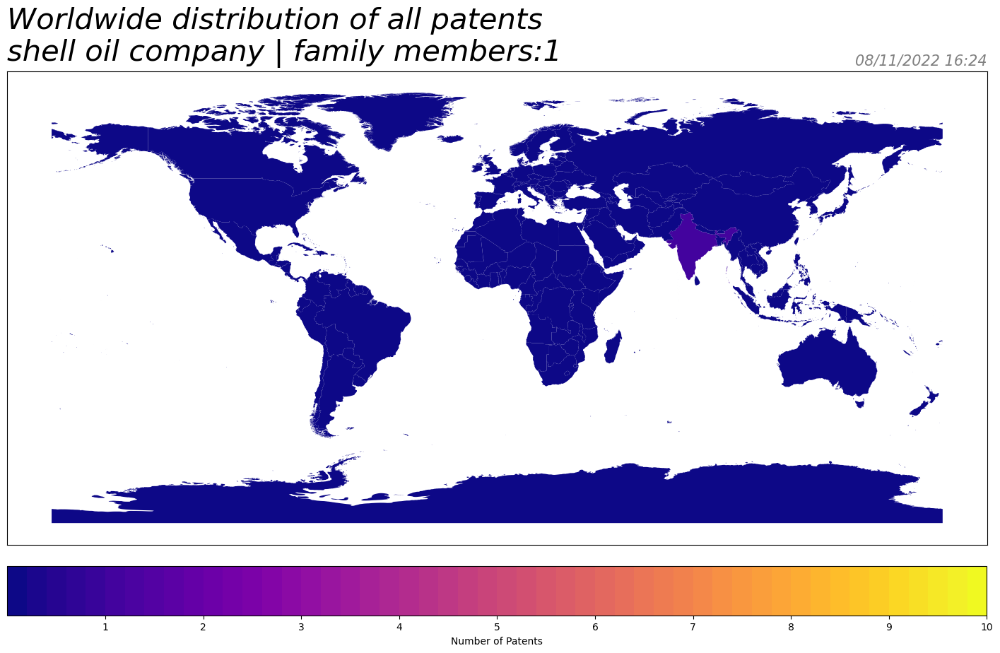

length of the family: 1 
the family: ['IN201002696P4']
countries and their total count:
india: 1 

None


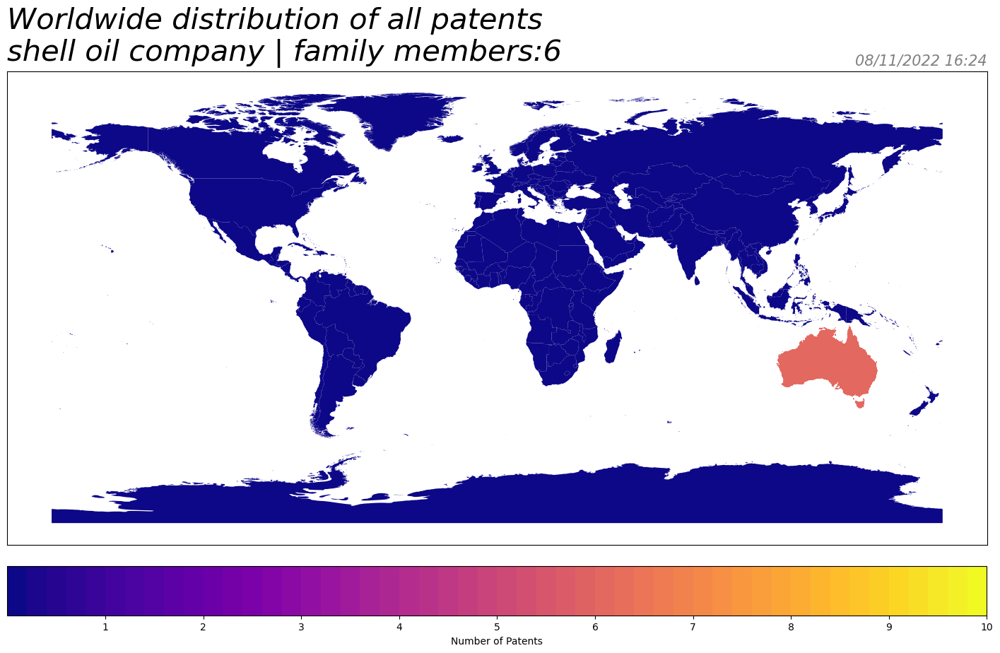

length of the family: 6 
the family: ['AU2012203086B2', 'AU2012203086A1', 'AU2012203086A8', 'AU2012203086B8', 'AU2012203096A1', 'AU2012203096B2']
countries and their total count:
australia: 6 

None


In [94]:
#plot for all patents (granted and not granted)
plot_worldmap_for_each_family(data_all_total,"all")
